# Overview

The City of Boston is the most populous city of the Commonwealth of Massachusetts and the 24th most populous city in the US.
It plays host to one of the oldest marathons in the world, The Boston Marathon, it is the city where Alexander Graham Bell made his first phone call, and it is often referred to as the Cradle of Liberty as it is the site of some of the most significant moments in the U.S History.

However, just as any other major city it faces a persistent major problem: **crime**. 

This EDA focuses on UCR Part One and Two crimes in Boston from January 2016 to December 2017, the years with complete entries.

This analyst hopes to identify patterns through general analysis of the basic questions; the whats, wheres, and whens, and then proceed to narrow down the observation to the top 5 most frequent crimes in Boston. By the end of this EDA, this analyst hopes to provide insights and hopefully could provide actionable suggestions as an answer to the problems.

Dataframe description:
Crime incident reports are provided by Boston Police Department (BPD) to document the initial details surrounding an incident to which BPD officers respond. This is a dataset containing records from the new crime incident report system, which includes a reduced set of fields focused on capturing the type of incident as well as when and where it occurred.

Provided by:
Analyze Boston

# Packages Used

In [247]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches
import folium
from folium.plugins import HeatMap
import geopandas as gpd
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp
from pylab import rcParams
pd.options.mode.chained_assignment = None



# Data Cleaning

## Original Dataframe

In [248]:
df = pd.read_csv("crime.csv", encoding = "windows-1252")
df

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319068,I050310906-00,3125,Warrant Arrests,WARRANT ARREST,D4,285,NaN,2016-06-05 17:25:00,2016,6,Sunday,17,Part Three,COVENTRY ST,42.336951,-71.085748,"(42.33695098, -71.08574813)"
319069,I030217815-08,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",E18,520,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,Part One,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319070,I030217815-08,3125,Warrant Arrests,WARRANT ARREST,E18,520,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,Part Three,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319071,I010370257-00,3125,Warrant Arrests,WARRANT ARREST,E13,569,NaN,2016-05-31 19:35:00,2016,5,Tuesday,19,Part Three,NEW WASHINGTON ST,42.302333,-71.111565,"(42.30233307, -71.11156487)"


### Data Checking

In [249]:
def df_checker(df):
    print (f"**Shape**\n{df.shape}",
           f"\n\n**Unique Values**\n{df.nunique()}",
           f"\n\n**Data Type**\n{df.dtypes}",
           f"\n\n**Null Values**\n{df.isnull().sum()}",
           f"\n\n**Latest Entry**\n{df['OCCURRED_ON_DATE'].max()}",
           f"\n\n**Earliest Entry**\n{df['OCCURRED_ON_DATE'].min()}")

In [250]:
df_checker(df)

**Shape**
(319073, 17) 

**Unique Values**
INCIDENT_NUMBER        282517
OFFENSE_CODE              222
OFFENSE_CODE_GROUP         67
OFFENSE_DESCRIPTION       244
DISTRICT                   12
REPORTING_AREA            879
SHOOTING                    1
OCCURRED_ON_DATE       233229
YEAR                        4
MONTH                      12
DAY_OF_WEEK                 7
HOUR                       24
UCR_PART                    4
STREET                   4657
Lat                     18178
Long                    18178
Location                18194
dtype: int64 

**Data Type**
INCIDENT_NUMBER         object
OFFENSE_CODE             int64
OFFENSE_CODE_GROUP      object
OFFENSE_DESCRIPTION     object
DISTRICT                object
REPORTING_AREA          object
SHOOTING                object
OCCURRED_ON_DATE        object
YEAR                     int64
MONTH                    int64
DAY_OF_WEEK             object
HOUR                     int64
UCR_PART                object
STREET         

### Duplicate Dropping

In [251]:
df.drop_duplicates(subset=["INCIDENT_NUMBER"],keep = "first", inplace =True)
df

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319066,I060168073-00,1864,Drug Violation,DRUGS - POSS CLASS D - INTENT MFR DIST DISP,E13,912,NaN,2018-01-27 14:01:00,2018,1,Saturday,14,Part Two,CENTRE ST,42.322838,-71.100967,"(42.32283759, -71.10096723)"
319068,I050310906-00,3125,Warrant Arrests,WARRANT ARREST,D4,285,NaN,2016-06-05 17:25:00,2016,6,Sunday,17,Part Three,COVENTRY ST,42.336951,-71.085748,"(42.33695098, -71.08574813)"
319069,I030217815-08,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",E18,520,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,Part One,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319071,I010370257-00,3125,Warrant Arrests,WARRANT ARREST,E13,569,NaN,2016-05-31 19:35:00,2016,5,Tuesday,19,Part Three,NEW WASHINGTON ST,42.302333,-71.111565,"(42.30233307, -71.11156487)"


In [252]:

df_checker(df)

**Shape**
(282517, 17) 

**Unique Values**
INCIDENT_NUMBER        282517
OFFENSE_CODE              202
OFFENSE_CODE_GROUP         67
OFFENSE_DESCRIPTION       210
DISTRICT                   12
REPORTING_AREA            879
SHOOTING                    1
OCCURRED_ON_DATE       233229
YEAR                        4
MONTH                      12
DAY_OF_WEEK                 7
HOUR                       24
UCR_PART                    4
STREET                   4657
Lat                     18178
Long                    18178
Location                18194
dtype: int64 

**Data Type**
INCIDENT_NUMBER         object
OFFENSE_CODE             int64
OFFENSE_CODE_GROUP      object
OFFENSE_DESCRIPTION     object
DISTRICT                object
REPORTING_AREA          object
SHOOTING                object
OCCURRED_ON_DATE        object
YEAR                     int64
MONTH                    int64
DAY_OF_WEEK             object
HOUR                     int64
UCR_PART                object
STREET         

As we can see, the amount of items in **shape** are the same amount in **unique items** meaning all duplicate entries have been dropped.

### Further Cleaning

<AxesSubplot: >

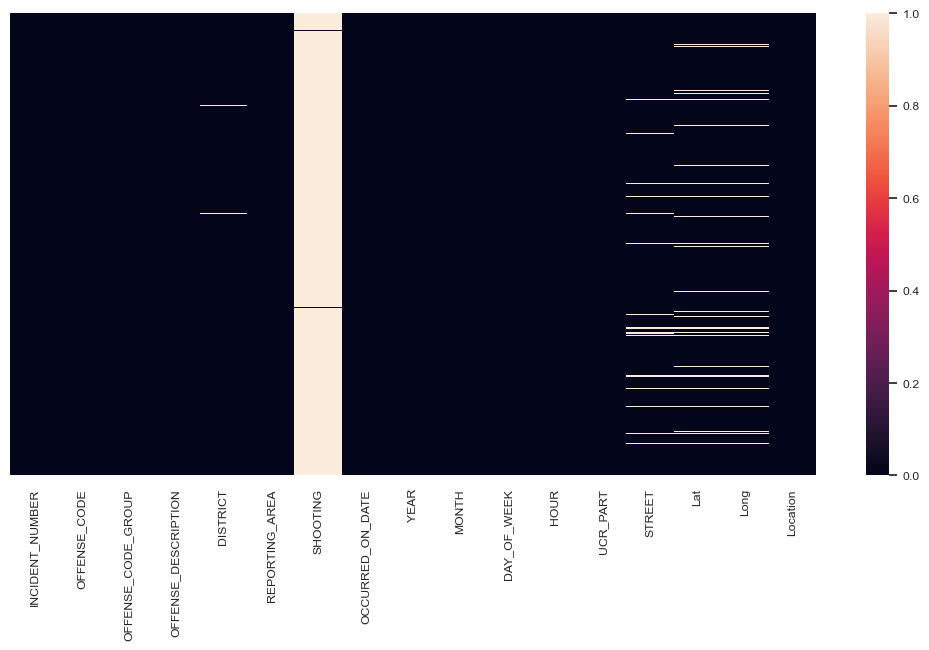

In [253]:
figure = plt.figure(figsize=(13,6))
sns.heatmap(df.isnull(),yticklabels='')

* "Shooting" column has **281,891** null values out of **282,517** incidents. 

* For reasons such as inability to confirm if NaN values means shooting not involved or if it means data entry error, and also because we will not be focusing on shooting which lowers the significance of the data, **shooting will be dropped**.

* "Offense_Code" will not be used and dropped as we will be using "Offense_Code_Group" for more clarity.

* Removing "location" because "latitude" and "longitude" will be used instead.

* Removing street because "latitude" and "longitude" will be used.

* 2015 entry missing 5 months worth of data, almost half the year. 2018 entry missing 3 months worth of data, a quarter year. The analysis will proceed with complete entries from 2016 - 2017 for accuracy.


In [254]:
df = df.drop(["SHOOTING", "OFFENSE_CODE","STREET" ,"Location","REPORTING_AREA"], axis=1)


df = df.loc[df["YEAR"].isin([2016,2017])]

df

,INCIDENT_NUMBER,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Lat,Long
569,I182070304,Fraud,FRAUD - IMPERSONATION,D4,2017-11-01 00:00:00,2017,11,Wednesday,0,Part Two,42.339268,-71.072088
744,I182070115,Investigate Property,INVESTIGATE PROPERTY,D14,2017-10-11 17:43:00,2017,10,Wednesday,17,Part Three,42.346501,-71.136128
923,I182069920,Property Lost,PROPERTY - LOST,B2,2017-08-31 12:08:00,2017,8,Thursday,12,Part Three,42.331925,-71.084112
1162,I182069657,Fraud,FRAUD - FALSE PRETENSE / SCHEME,D14,2017-06-27 07:00:00,2017,6,Tuesday,7,Part Two,42.338482,-71.152890
1444,I182069334,Property Lost,PROPERTY - LOST,B3,2017-12-08 22:00:00,2017,12,Friday,22,Part Three,42.279591,-71.081323
...,...,...,...,...,...,...,...,...,...,...,...,...
319052,I100636670-00,Larceny,LARCENY OTHER $50 TO $199,D4,2016-06-05 17:23:00,2016,6,Sunday,17,Part One,42.336951,-71.085748
319057,I100033064-00,Violations,VAL - OPERATING AFTER REV/SUSP.,B2,2016-07-29 18:20:00,2016,7,Friday,18,Part Two,42.321770,-71.097798
319059,I090321958-00,Warrant Arrests,WARRANT ARREST,C11,2016-02-01 01:43:00,2016,2,Monday,1,Part Three,NaN,NaN
319068,I050310906-00,Warrant Arrests,WARRANT ARREST,D4,2016-06-05 17:25:00,2016,6,Sunday,17,Part Three,42.336951,-71.085748


We will be focusing on actual crimes and considering **UCR PART THREE** includes reports such as traffic accidents and health emergencies, we will filter the dataframe to only show entries of **UCR PART ONE** and **UCR PART TWO**

In [255]:

df = df.loc[(df["UCR_PART"] == "Part One") | (df["UCR_PART"] == "Part Two")]
df["OCCURRED_ON_DATE"] = pd.to_datetime(df["OCCURRED_ON_DATE"], format='%Y/%m/%d')

Columns will be renamed for better comprehension.

In [256]:

mylabels = {"INCIDENT_NUMBER" : "Case ID",
            "OFFENSE_CODE_GROUP" : "Offense Type",
            "OFFENSE_DESCRIPTION" : "Description",
            "DISTRICT":"District",
            "OCCURRED_ON_DATE" : "Date",
            "YEAR":"Year",
            "MONTH": "Month",
            "DAY_OF_WEEK" : "Day",
            "HOUR" : "Hour",
            "UCR_PART" : "UCR Part",
            "Lat" : "Latitude",
            "Long" : "Longitude"}
df.rename(index = str, columns = mylabels, inplace = True)
df

,Case ID,Offense Type,Description,District,Date,Year,Month,Day,Hour,UCR Part,Latitude,Longitude
569,I182070304,Fraud,FRAUD - IMPERSONATION,D4,2017-11-01 00:00:00,2017,11,Wednesday,0,Part Two,42.339268,-71.072088
1162,I182069657,Fraud,FRAUD - FALSE PRETENSE / SCHEME,D14,2017-06-27 07:00:00,2017,6,Tuesday,7,Part Two,42.338482,-71.152890
1813,I182068927,Fraud,FRAUD - IMPERSONATION,C11,2016-01-10 00:00:00,2016,1,Sunday,0,Part Two,42.280498,-71.048885
2302,I182068383,Other,TRESPASSING,C6,2017-09-01 08:00:00,2017,9,Friday,8,Part Two,42.335468,-71.044891
2974,I182067634,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,C11,2017-10-11 00:00:00,2017,10,Wednesday,0,Part Two,42.318532,-71.057790
...,...,...,...,...,...,...,...,...,...,...,...,...
319026,I120283195-00,Larceny,LARCENY ALL OTHERS,B2,2016-04-27 00:00:00,2016,4,Wednesday,0,Part One,42.335062,-71.093168
319038,I110694557-00,Prostitution,PROSTITUTE - COMMON NIGHTWALKER,B3,2016-01-22 09:45:00,2016,1,Friday,9,Part Two,42.288767,-71.072897
319045,I110372326-00,Aggravated Assault,ASSAULT & BATTERY D/W - OTHER,A1,2016-06-14 09:40:00,2016,6,Tuesday,9,Part One,42.357428,-71.058326
319052,I100636670-00,Larceny,LARCENY OTHER $50 TO $199,D4,2016-06-05 17:23:00,2016,6,Sunday,17,Part One,42.336951,-71.085748


Considering some of the entries have different capitalization styles, it will be uniformed for formality and aesthetics.

In [257]:
#Lack of uniform capitalization annoys me. 
df["Description"] = df["Description"].str.capitalize()
df["Offense Type"] = df["Offense Type"].str.capitalize()
df

,Case ID,Offense Type,Description,District,Date,Year,Month,Day,Hour,UCR Part,Latitude,Longitude
569,I182070304,Fraud,Fraud - impersonation,D4,2017-11-01 00:00:00,2017,11,Wednesday,0,Part Two,42.339268,-71.072088
1162,I182069657,Fraud,Fraud - false pretense / scheme,D14,2017-06-27 07:00:00,2017,6,Tuesday,7,Part Two,42.338482,-71.152890
1813,I182068927,Fraud,Fraud - impersonation,C11,2016-01-10 00:00:00,2016,1,Sunday,0,Part Two,42.280498,-71.048885
2302,I182068383,Other,Trespassing,C6,2017-09-01 08:00:00,2017,9,Friday,8,Part Two,42.335468,-71.044891
2974,I182067634,Confidence games,Fraud - credit card / atm fraud,C11,2017-10-11 00:00:00,2017,10,Wednesday,0,Part Two,42.318532,-71.057790
...,...,...,...,...,...,...,...,...,...,...,...,...
319026,I120283195-00,Larceny,Larceny all others,B2,2016-04-27 00:00:00,2016,4,Wednesday,0,Part One,42.335062,-71.093168
319038,I110694557-00,Prostitution,Prostitute - common nightwalker,B3,2016-01-22 09:45:00,2016,1,Friday,9,Part Two,42.288767,-71.072897
319045,I110372326-00,Aggravated assault,Assault & battery d/w - other,A1,2016-06-14 09:40:00,2016,6,Tuesday,9,Part One,42.357428,-71.058326
319052,I100636670-00,Larceny,Larceny other $50 to $199,D4,2016-06-05 17:23:00,2016,6,Sunday,17,Part One,42.336951,-71.085748


In [258]:
count = df.groupby(["Year"])["Year"].count()
count

Year
2016    43003
2017    40654
Name: Year, dtype: int64

Adding seasons to see if there are connections between crime, season, and American seasonal holidays (Spring Break, Summer Break, etc)
* Spring: March(3), April (4),May(5)
* Summer: June(6), July(7), August(8)
* Autumn / Fall: September (9), October (10), November(11)
* Winter: December (12), January (1), February (2)

season source: https://seasonsyear.com/USA/Massachusetts

In [259]:
def season(month):
    if 3 <= month < 6 : return "Spring"
    elif 6 <= month < 9 : return "Summer"
    elif 9 <= month < 12: return "Autumn"
    else : return "Winter"

Applying the additional columns.

In [260]:
df["Season"] = df["Month"].apply(season)
df

,Case ID,Offense Type,Description,District,Date,Year,Month,Day,Hour,UCR Part,Latitude,Longitude,Season
569,I182070304,Fraud,Fraud - impersonation,D4,2017-11-01 00:00:00,2017,11,Wednesday,0,Part Two,42.339268,-71.072088,Autumn
1162,I182069657,Fraud,Fraud - false pretense / scheme,D14,2017-06-27 07:00:00,2017,6,Tuesday,7,Part Two,42.338482,-71.152890,Summer
1813,I182068927,Fraud,Fraud - impersonation,C11,2016-01-10 00:00:00,2016,1,Sunday,0,Part Two,42.280498,-71.048885,Winter
2302,I182068383,Other,Trespassing,C6,2017-09-01 08:00:00,2017,9,Friday,8,Part Two,42.335468,-71.044891,Autumn
2974,I182067634,Confidence games,Fraud - credit card / atm fraud,C11,2017-10-11 00:00:00,2017,10,Wednesday,0,Part Two,42.318532,-71.057790,Autumn
...,...,...,...,...,...,...,...,...,...,...,...,...,...
319026,I120283195-00,Larceny,Larceny all others,B2,2016-04-27 00:00:00,2016,4,Wednesday,0,Part One,42.335062,-71.093168,Spring
319038,I110694557-00,Prostitution,Prostitute - common nightwalker,B3,2016-01-22 09:45:00,2016,1,Friday,9,Part Two,42.288767,-71.072897,Winter
319045,I110372326-00,Aggravated assault,Assault & battery d/w - other,A1,2016-06-14 09:40:00,2016,6,Tuesday,9,Part One,42.357428,-71.058326,Summer
319052,I100636670-00,Larceny,Larceny other $50 to $199,D4,2016-06-05 17:23:00,2016,6,Sunday,17,Part One,42.336951,-71.085748,Summer


Rearranging **Season** and **Quarter** columns to be next to months to make it more intuitive. 

In [261]:
#Moving "Season" and next to "Month" because it just makes more sense.
df = df[['Case ID',
 'Offense Type',
 'Description',
 'District',
 'Date',
 'Year',
 'Month',
 'Season',
 'Day',
 'Hour',
 'UCR Part',
 'Latitude',
 'Longitude']]

df

,Case ID,Offense Type,Description,District,Date,Year,Month,Season,Day,Hour,UCR Part,Latitude,Longitude
569,I182070304,Fraud,Fraud - impersonation,D4,2017-11-01 00:00:00,2017,11,Autumn,Wednesday,0,Part Two,42.339268,-71.072088
1162,I182069657,Fraud,Fraud - false pretense / scheme,D14,2017-06-27 07:00:00,2017,6,Summer,Tuesday,7,Part Two,42.338482,-71.152890
1813,I182068927,Fraud,Fraud - impersonation,C11,2016-01-10 00:00:00,2016,1,Winter,Sunday,0,Part Two,42.280498,-71.048885
2302,I182068383,Other,Trespassing,C6,2017-09-01 08:00:00,2017,9,Autumn,Friday,8,Part Two,42.335468,-71.044891
2974,I182067634,Confidence games,Fraud - credit card / atm fraud,C11,2017-10-11 00:00:00,2017,10,Autumn,Wednesday,0,Part Two,42.318532,-71.057790
...,...,...,...,...,...,...,...,...,...,...,...,...,...
319026,I120283195-00,Larceny,Larceny all others,B2,2016-04-27 00:00:00,2016,4,Spring,Wednesday,0,Part One,42.335062,-71.093168
319038,I110694557-00,Prostitution,Prostitute - common nightwalker,B3,2016-01-22 09:45:00,2016,1,Winter,Friday,9,Part Two,42.288767,-71.072897
319045,I110372326-00,Aggravated assault,Assault & battery d/w - other,A1,2016-06-14 09:40:00,2016,6,Summer,Tuesday,9,Part One,42.357428,-71.058326
319052,I100636670-00,Larceny,Larceny other $50 to $199,D4,2016-06-05 17:23:00,2016,6,Summer,Sunday,17,Part One,42.336951,-71.085748


Initial insight on crimes.

In [262]:
df["Offense Type"].value_counts()

Larceny                            14831
Vandalism                           8810
Simple assault                      8365
Other                               7982
Drug violation                      6887
Larceny from motor vehicle          6435
Aggravated assault                  4070
Fraud                               3409
Residential burglary                3154
Harassment                          2746
Robbery                             2630
Auto theft                          2611
Violations                          2323
Confidence games                    1809
Disorderly conduct                  1008
Restraining order violations         976
Counterfeiting                       856
Commercial burglary                  804
Firearm violations                   690
Ballistics                           560
Liquor violation                     500
Recovered stolen property            476
Offenses against child / family      295
Operating under the influence        264
Evading fare    

Checking to see if there are inconsistencies in entry for "Descriptions"

In [263]:
df["Description"].value_counts()[:30]

Vandalism                                         8640
Assault simple - battery                          7951
Larceny theft from mv - non-accessory             5361
Larceny theft from building                       5292
Threats to do bodily harm                         4758
Larceny shoplifting                               4593
Larceny all others                                3345
Harassment                                        2746
Assault - aggravated - battery                    2643
Fraud - false pretense / scheme                   2481
Auto theft                                        1974
Fraud - credit card / atm fraud                   1809
Robbery - street                                  1802
Burglary - residential - force                    1525
Assault - aggravated                              1426
Trespassing                                       1355
Burglary - residential - no force                 1286
Larceny theft of bicycle                          1232
Val - viol

In [264]:
df["Description"].value_counts()[-30:]


Kidnapping/custodial kidnapping                19
Prostitution                                   18
Drugs - consp to viol controlled substance     17
Kidnapping - enticing or attempted             15
Burglary - other - attempt                     13
Obscene phone calls                            13
Weapon - firearm - sale / trafficking          10
Larceny theft from coin-op machine              8
Fraud - welfare                                 7
Explosives - possession or use                  6
Violation - hawker and peddler                  6
Custodial kidnapping                            6
Abduction - inticing                            4
Prisoner escape / escape & recapture            3
Gambling - betting / wagering                   3
Drugs - class d trafficking over 50 grams       2
Biological threats                              2
Prostitution - common nightwalker               2
Prostitution - assisting or promoting           2
Contributing to delinquency of minor            2


Here we see some inconsistencies in the entries of the "Description Column" leading to values out of place. Manual renaming will be applied to fix.

In [265]:
df.replace("Larceny other $50 to $199", "Larceny all others", inplace=True) #too much detail (TMD), wrong format (WF)
df.replace("Larceny in a building $200 & over", "Larceny theft from building", inplace=True) #TMD, WF
df.replace("Prostitute - common nightwalker", "Prostitution - common nightwalker", inplace=True) #WF
df.replace("Assault & battery d/w - other", "Assault - aggravated - battery", inplace=True) #TMD, WF
df.replace("Drugs - poss class e intent to mf dist disp", "Drugs - poss class d - intent to mfr dist disp", inplace=True) #Typo missing "R"
df.replace("Drugs - poss class a - heroin, etc.", "Drugs - poss class a - heroin, etc. ", inplace=True) #Spacing at End
df.replace("Drugs - glue inhalation", "Drugs - other", inplace=True) #Belongs to others. Glue sniffing lol.
df.replace("Conspiracy except drug law", "Drugs - other", inplace=True) #Not sure what this is, goes to others.
df.replace("Drugs - class a trafficking over 18 grams", "Drugs - poss class a - intent to mfr dist disp", inplace=True) #WF
df.replace("Drugs - class b trafficking over 18 grams", "Drugs - poss class b - intent to mfr dist disp", inplace=True) #WF
df.replace("Drugs - class d trafficking over 50 grams", "Drugs - poss class d - intent to mfr dist disp", inplace=True) #WF

In [266]:
df["Description"].value_counts()[-20:]

Prostitution                                  18
Drugs - consp to viol controlled substance    17
Kidnapping - enticing or attempted            15
Obscene phone calls                           13
Burglary - other - attempt                    13
Weapon - firearm - sale / trafficking         10
Larceny theft from coin-op machine             8
Fraud - welfare                                7
Custodial kidnapping                           6
Violation - hawker and peddler                 6
Explosives - possession or use                 6
Abduction - inticing                           4
Prisoner escape / escape & recapture           3
Gambling - betting / wagering                  3
Prostitution - common nightwalker              3
Prostitution - assisting or promoting          2
Biological threats                             2
Contributing to delinquency of minor           2
Auto theft - recovered in by police            1
Auto theft other                               1
Name: Description, d

The label "Other" offense types appears as 4th most crimes committed but it covers various types of reports, some more individual as others such as "pornography" and some are more serious such as "kidnapping". Because the nature of the reports varies widely, it will be removed for precision. 

In [267]:
df.loc[(df["Offense Type"]=="Other")].head()

,Case ID,Offense Type,Description,District,Date,Year,Month,Season,Day,Hour,UCR Part,Latitude,Longitude
2302,I182068383,Other,Trespassing,C6,2017-09-01 08:00:00,2017,9,Autumn,Friday,8,Part Two,42.335468,-71.044891
9799,I182060154,Other,Obscene materials - pornography,C11,2017-07-07 23:00:00,2017,7,Summer,Friday,23,Part Two,42.281586,-71.060334
16134,I182053399,Other,Kidnapping/custodial kidnapping,C11,2017-07-01 12:00:00,2017,7,Summer,Saturday,12,Part Two,42.280917,-71.065654
21441,I182047771,Other,Threats to do bodily harm,C11,2016-01-01 12:00:00,2016,1,Winter,Friday,12,Part Two,42.299909,-71.064248
25309,I182043696,Other,Threats to do bodily harm,D14,2017-11-14 13:38:00,2017,11,Autumn,Tuesday,13,Part Two,42.359236,-71.128540


Removing "Other"

In [268]:
df = df[df["Offense Type"] != "Other"]
df

,Case ID,Offense Type,Description,District,Date,Year,Month,Season,Day,Hour,UCR Part,Latitude,Longitude
569,I182070304,Fraud,Fraud - impersonation,D4,2017-11-01 00:00:00,2017,11,Autumn,Wednesday,0,Part Two,42.339268,-71.072088
1162,I182069657,Fraud,Fraud - false pretense / scheme,D14,2017-06-27 07:00:00,2017,6,Summer,Tuesday,7,Part Two,42.338482,-71.152890
1813,I182068927,Fraud,Fraud - impersonation,C11,2016-01-10 00:00:00,2016,1,Winter,Sunday,0,Part Two,42.280498,-71.048885
2974,I182067634,Confidence games,Fraud - credit card / atm fraud,C11,2017-10-11 00:00:00,2017,10,Autumn,Wednesday,0,Part Two,42.318532,-71.057790
4058,I182066480,Fraud,Fraud - impersonation,B2,2017-04-28 00:00:00,2017,4,Spring,Friday,0,Part Two,42.320184,-71.090500
...,...,...,...,...,...,...,...,...,...,...,...,...,...
319026,I120283195-00,Larceny,Larceny all others,B2,2016-04-27 00:00:00,2016,4,Spring,Wednesday,0,Part One,42.335062,-71.093168
319038,I110694557-00,Prostitution,Prostitution - common nightwalker,B3,2016-01-22 09:45:00,2016,1,Winter,Friday,9,Part Two,42.288767,-71.072897
319045,I110372326-00,Aggravated assault,Assault - aggravated - battery,A1,2016-06-14 09:40:00,2016,6,Summer,Tuesday,9,Part One,42.357428,-71.058326
319052,I100636670-00,Larceny,Larceny all others,D4,2016-06-05 17:23:00,2016,6,Summer,Sunday,17,Part One,42.336951,-71.085748


Top 5 crime after "Other" is removed.

In [269]:
df["Offense Type"].value_counts().index[:5]

Index(['Larceny', 'Vandalism', 'Simple assault', 'Drug violation',
       'Larceny from motor vehicle'],
      dtype='object')

# Statistical Analysis

### Initial Descriptive Analysis

In [270]:
def breaker (ThisIsMyLittleFunctionAndICanNameItAnythingIWant):
    return ThisIsMyLittleFunctionAndICanNameItAnythingIWant * 100

breaker ("=")

'===================================================================================================='

Basic Statistics 

Crime per year in Boston: 

 Year
2016    38882
2017    36793
Name: Case ID, dtype: int64 

Top 5 Crimes in Boston in 2016-2017:

Offense Type
Larceny                       14831
Vandalism                      8810
Simple assault                 8365
Drug violation                 6887
Larceny from motor vehicle     6435
dtype: int64 

Top 5 time of day with most crime reports: 

Hour
18    5283
17    5273
16    4958
12    4622
19    4594
Name: Case ID, dtype: int64 
 Crime frequency per day of week: 

           Counts  Percent
Day                       
Friday      11568    15.29
Wednesday   11186    14.78
Tuesday     10998    14.53
Thursday    10856    14.35
Monday      10824    14.30
Saturday    10583    13.98
Sunday       9660    12.77 

There's similar crime frequency distribution in days of the week. 
With a crime frequency of: 104.0 crimes per day. 
 Crime frequency per month: 

       Counts  Percent
Month                 
1        6251     8.26
2        553

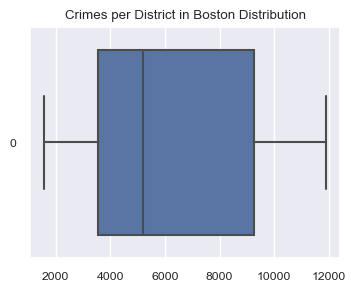

In [271]:
df_filter = df[["Case ID","Offense Type","Year"]]
df_filter_district = df[["Case ID","District","Year"]]
crime_per_year = df.groupby("Year").count()["Case ID"].nlargest(5)
top5 = df_filter.value_counts("Offense Type").head(5)
top5timeofday = df.groupby("Hour").count()["Case ID"].nlargest(5)

day_of_week_c = month_c = df["Day"].value_counts().rename_axis("Day").reset_index(name="Counts").sort_values("Day").set_index("Day")
day_of_week_c = df["Case ID"].count() / 2 / 365

month_c = df["Month"].value_counts().rename_axis("Month").reset_index(name="Counts").sort_values("Month").set_index("Month")
month_c["Percent"] = round((month_c["Counts"] / 
                  month_c["Counts"].sum()) * 100,2)
month_c_mean = month_c["Counts"].mean()

day_of_week_c = df["Day"].value_counts().rename_axis("Day").reset_index(name="Counts").sort_values("Day").set_index("Day")
day_of_week_c["Percent"] = round((day_of_week_c["Counts"] / 
                  day_of_week_c["Counts"].sum()) * 100,2)
avg_crime_per_day = df["Case ID"].count() / 2 / 365



districts = df["District"].value_counts().rename_axis("District").reset_index(name="Counts")
districts["Percent"] = round((districts["Counts"] / 
                  districts["Counts"].sum()) * 100,2)
district_c_mean = districts["Counts"].mean()

plt.figure(figsize=(4,3))
district_box = sns.boxplot(data=districts["Counts"],orient="h").set(title="Crimes per District in Boston Distribution")



print (f"Basic Statistics",
       f"\n\n{breaker('=')}",
       f"\nCrime per year in Boston:",
       f"\n\n {crime_per_year}",
       f"\n\nTop 5 Crimes in Boston in 2016-2017:\n\n{top5}",
       f"\n{breaker ('=')}",
       f"\n\nTop 5 time of day with most crime reports: \n\n{top5timeofday}",
       f"\n{breaker ('=')}",
       f"\n Crime frequency per day of week: \n\n{day_of_week_c.sort_values('Percent', ascending= False)}",
       f"\n\nThere's similar crime frequency distribution in days of the week. \nWith a crime frequency of: {round(avg_crime_per_day,0)} crimes per day.",
       f"\n{breaker ('=')}",
       f"\n Crime frequency per month: \n\n{month_c}",
       f"\n\n Average crime frequency per month: {month_c_mean} incidents",
       f"\n{breaker ('=')}",
       f"\n\n Crime count per district in Boston 2016-2017: \n\n{districts}",
       f"\n\n Average crime frequency per district: {district_c_mean} incidents") 

# Data Visualization

### Now we're going to focus on the basics insights.

#### Setting up some colors for the plots.

In [272]:

fire = ["#7C0A02","#FC4F4F","#ff4500","#ff7e00","#F1BC31"]
fire_r = fire[::-1]
police_line = ["#000000", "#F6BE00"]
siren = ["#4A53E1", "#FF6170"]
noyellow = ["#422680","#7C0A02","#ff4500","#660F56","#AE2D68"]
ryt = ["#EC6B56","#FFC154","#47B39C"]
uniform = ["#010079","#CD9703"]

sns.color_palette(ryt)

[(0.9254901960784314, 0.4196078431372549, 0.33725490196078434),
 (1.0, 0.7568627450980392, 0.32941176470588235),
 (0.2784313725490196, 0.7019607843137254, 0.611764705882353)]

In [273]:
sns.color_palette(police_line)
#Seems fitting.

[(0.0, 0.0, 0.0), (0.9647058823529412, 0.7450980392156863, 0.0)]

In [274]:
df.groupby("Description")["Case ID"].nunique()

Description
Affray                                            145
Annoying and accosting                             48
Assault - aggravated                             1426
Assault - aggravated - battery                   2644
Assault - simple                                  382
                                                 ... 
Viol. of restraining order w no arrest            824
Weapon - firearm - carrying / possessing, etc     378
Weapon - firearm - other violation                 83
Weapon - firearm - sale / trafficking              10
Weapon - other - carrying / possessing, etc       219
Name: Case ID, Length: 104, dtype: int64

#### Crimes in Boston 2016-2017 frequency, separated by years.

Text(0, 0.5, 'Offense Type')

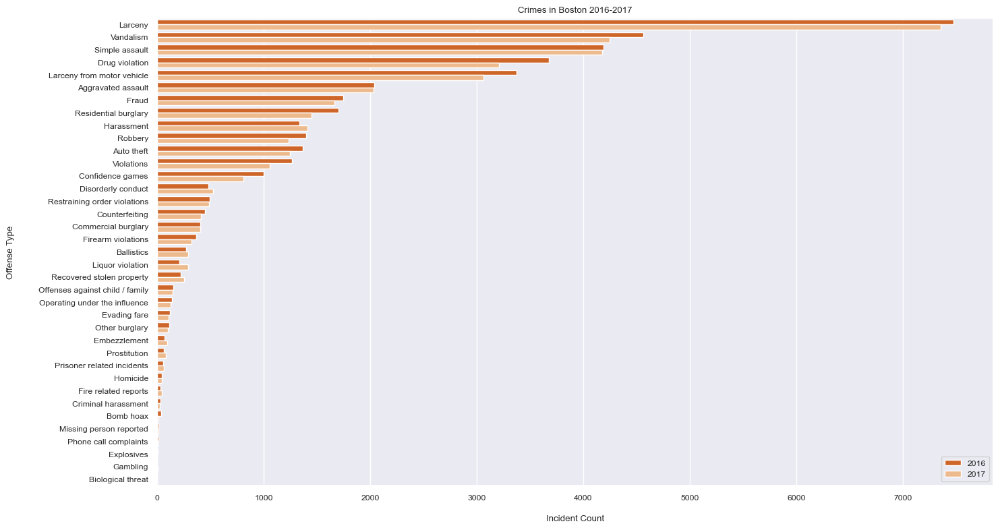

In [275]:
plt.figure(figsize=(16,9))
plt.title("Crimes in Boston 2016-2017")
sns.countplot(data=df, y="Offense Type",palette ="Oranges_r", hue= "Year", order = df["Offense Type"].value_counts().index)
plt.legend(loc="lower right")
plt.xlabel("Incident Count",labelpad=15)
plt.ylabel("Offense Type",labelpad=25)

From this visualization we learn that there is a decline in most crime report categories in 2017.

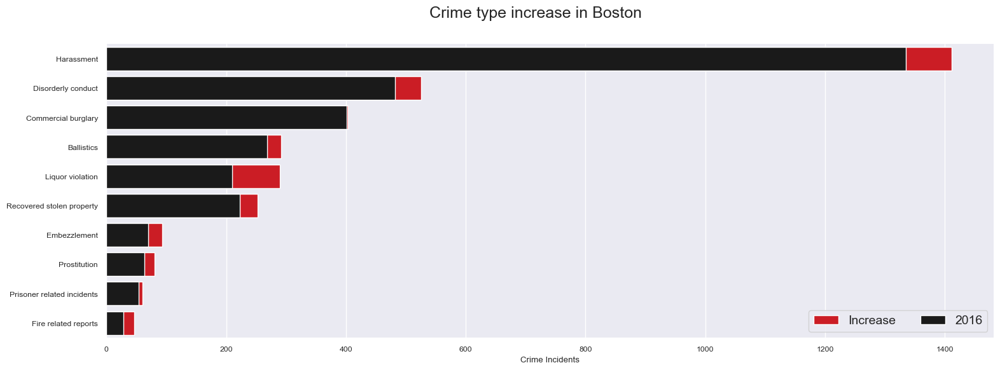

In [276]:
#Filtering out crimes that have increased (this took me HOURS to figure out)
df_filter = df[["Case ID","Offense Type","Year"]]
df2017 = df_filter[df_filter["Year"] == 2017]["Offense Type"].value_counts()
df2016 = df_filter[df_filter["Year"] == 2016]["Offense Type"].value_counts()
df_concat = pd.concat([df2017,df2016],axis=1,join="outer",keys=["2017","2016"])
df_filtered = df_concat.loc[(df_concat["2017"] > df_concat["2016"])].reset_index().rename(columns={'index':'Offense Type'}) 
df_filtered["Percentage"] = round(((df_filtered["2017"]-df_filtered["2016"])/df_filtered["2016"])*100)
percentage = list(df_filtered["Percentage"])


#Data Visualization
f, ax = plt.subplots(figsize=(18, 6))


plt.suptitle("Crime type increase in Boston",fontsize="18")

sns.set_color_codes("bright")
sns.barplot(x="2017", y= "Offense Type", data=df_filtered.sort_values("2017",ascending=False),label="Increase",color="r")

sns.set_color_codes("pastel")
sns.barplot(x="2016",y="Offense Type", data=df_filtered,label="2016",color="k")


ax.legend(ncol=2, loc="lower right", frameon=True, prop={"size":14})
ax.set( ylabel="", xlabel="Crime Incidents")

sns.despine(left=True,bottom=True)


Interestingly enough there are some crime categories that have experienced an increase in 2017 compared to 2016.

Text(0.5, 0.98, 'Crime Frequency Per Time of Day')

<Figure size 1200x400 with 0 Axes>

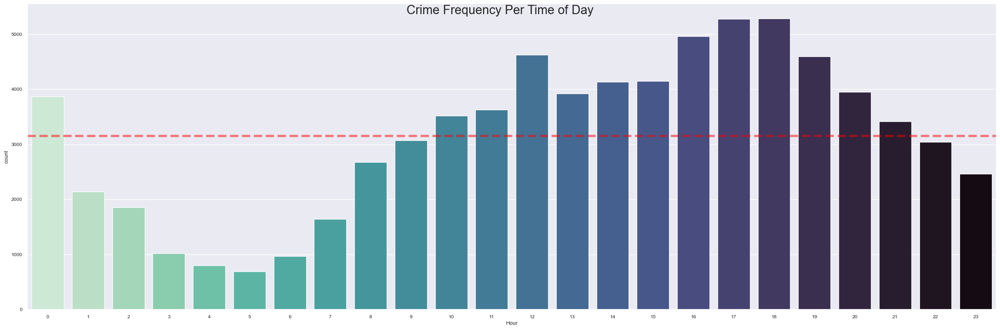

In [277]:
plt.figure(figsize=(12,4))
sns.set(font_scale=0.8)


sns.catplot(x='Hour',
        kind='count',
        height=8.27, 
        aspect=3,
        palette='mako_r',
        data=df)

plt.axhline(df.groupby("Hour").count().mean()["Case ID"] #The mean line
             ,alpha=0.5, c="red", linewidth=4, linestyle="--")

plt.suptitle("Crime Frequency Per Time of Day",fontsize=22)

In [278]:
df.groupby("Hour").count().mean()["Case ID"] 

3153.125

Red dotted lines represent the average count (3153) of the crimes committed per hour.

Crime activity is above the average line starting from 10:00 - 21:00, with an increase of activity on 00:00. 

#### Time and Day Line Chart

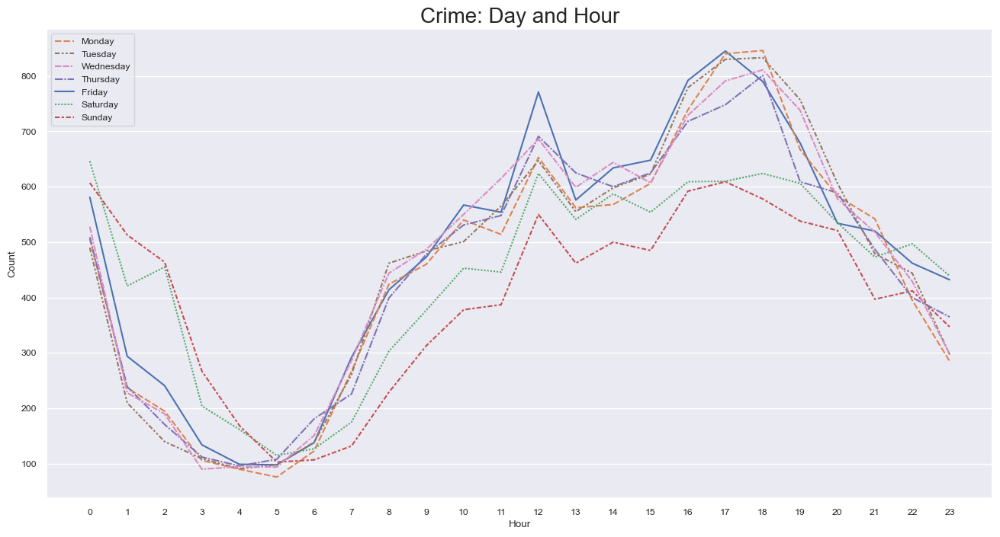

In [279]:
df_time = df[["Case ID", "Hour", "Day"]]
df_hour_day = df_time.groupby(["Hour","Day"]).size().reset_index().rename(columns = {0:"Count"})

plt.figure(figsize=(16,8))
sns.despine(left=True)
plt.title("Crime: Day and Hour",fontsize = 20)
sns.set_style("darkgrid")
lp = sns.lineplot(x="Hour", y="Count", data=df_hour_day, 
             hue="Day", style="Day",
             legend = "auto")

lp.set_xticks(range(24))
lp.grid(axis="x", linewidth=0)
handles, labels = plt.gca().get_legend_handles_labels()
order = [1,5,6,4,0,2,3]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order],loc="upper left")



Text(0.5, 0.98, 'Crime Hour and Day')

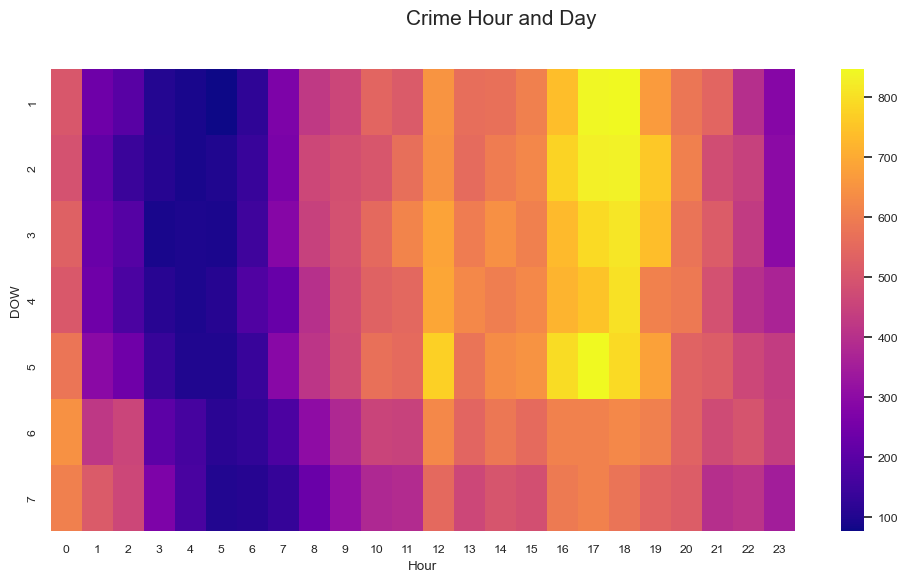

In [280]:
def day_of_week_num(day):
    if day == "Monday":
        return 1
    elif day == "Tuesday":
        return 2
    elif day == "Wednesday":
        return 3
    elif day == "Thursday":
        return 4
    elif day == "Friday":
        return 5
    elif day == "Saturday":
        return 6
    else:
        return 7
    
df_time.sort_values(["Day"])
df_time ["DOW"] = df_time["Day"].apply(day_of_week_num)
time_sorted = df_time.sort_values(by=["DOW"], ascending= True)

df_pivot = pd.pivot_table(data=time_sorted, columns = "Hour", index="DOW", values = "Case ID", aggfunc= "count" )

plt.figure(figsize=(12,6))
sns.heatmap(df_pivot,cmap="plasma")
plt.suptitle("Crime Hour and Day",fontsize=15)


There is a similar pattern of crime frequency per hour throughout all the days in a week.

Notable patterns:
- Lowest crime activity around 04:00 - 05:00. 
- Crime frequency gradually increases between 06:00 - 16:00 to 18:00, with a spike on 12:00 and peaks on 16:00 - 18:00.
- This could translate to increase of crime activity during lunch break hours and after work hours.
- Crime rate gradually declines from peak until another spike on 00:00. 
- Weekends have lower crime rate during daytime but higher crime activities during early hours.

Suggestion:
- Increase police activity before activity spikes such as on foot and in vehicle patrols.
- Increase police activity in the evening between 16:00 - 19:00 on weekdays.
- Increase police activity on early hours between 00:00 - 04:00 on weekends. 

### Crime per Month and Season

Text(0.5, 0.98, 'Crime Frequency Per Season')

<Figure size 1200x600 with 0 Axes>

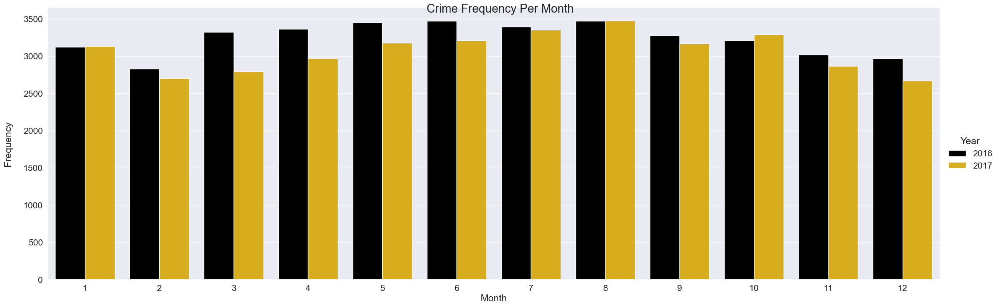

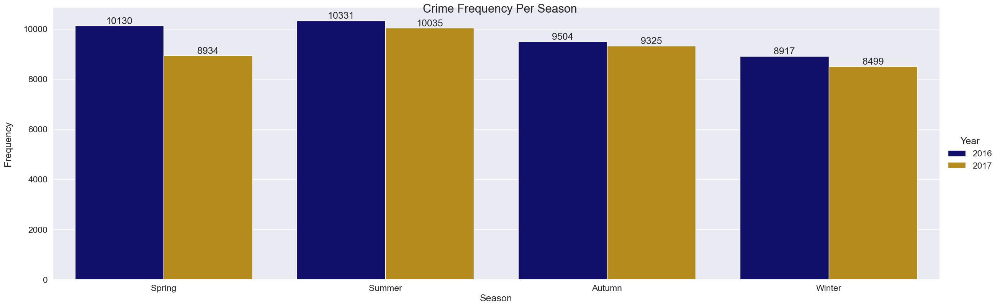

In [281]:
plt.figure(figsize=(12,6))
sns.set(font_scale=1.5)

plt.suptitle("Crime Frequency Per Month",fontsize=22)

ax1 = sns.catplot(x="Month",
        kind='count',
        height=8.27, 
        aspect=3,
        palette=police_line,
        data=df,
        hue = "Year")

ax1.set_ylabels("Frequency", labelpad=20)



plt.suptitle("Crime Frequency Per Month",fontsize=22)

ax2 = sns.catplot(x='Season',
                  kind='count',
                  height=8.27, 
                  aspect=3,
                  palette=uniform,
                  data=df,
                  hue = "Year",
                  order = ["Spring","Summer","Autumn","Winter"])

ax2.set_ylabels("Frequency", labelpad=20)
ax2.axes[0,0].bar_label(ax2.axes[0,0].containers[0])
ax2.axes[0,0].bar_label(ax2.axes[0,0].containers[1])
plt.suptitle("Crime Frequency Per Season",fontsize=22)



There is a decrease of crime activity per month in 2017.

Peak 3 months of crime activity is in month 5,6 and 8.
All months of the year has experienced a noticable decrease of crime frequency in 2017 except for month 8 and 1.

Summer is the season with higher crime frequencies both in 2016 and 2017, closely followed by Spring in 2016 and Autumn in 2017. Winter is the season with least crime in both years. Maybe it's too cold for crime?

### UCR Part Two Crime Geo Visualization

In [282]:

coords2 = df.loc[df["UCR Part"]=="Part Two"].loc[:,["Latitude","Longitude"]].dropna()

m2 = folium.Map(location=[df["Latitude"].max(),df["Longitude"].min()],
               tiles = "Stamen Toner",
               zoom_start=11)
HeatMap(data=coords2,radius=16, min_opacity=0.4).add_to(m2)

m2


UCR Part One Geo Visualization

In [283]:
coords = df.loc[df["UCR Part"]=="Part One"][["Latitude","Longitude"]].dropna()

m1 = folium.Map(location=[df["Latitude"].max(),df["Longitude"].min()],
               tiles = "Stamen Toner",
               zoom_start=11)
HeatMap(data=coords,radius=16, min_opacity=0.4).add_to(m1)

m1

Based on the geo heatmap visualization above, we can see that UCR Part One crimes are more concentrated in the central area in Boston, particularly starting from the downtown area and gradually dissipating as it spreads to the outer areas of Boston

If we zoom in we can see one area that has an interestingly bright hue, Boylston Plaza, which is a shopping mall.

UCR Part Two crimes are less centralized and has three noticable heat spots:
- Downtown Boston
- Harington Avenue
- Blue Hill Avenue

Including these major crime activity area in patrol route is highly advised. Cooperation with residents in the residential area heat spots could also be beneficial.

In [284]:
df[df["Offense Type"] == "Violations"]

,Case ID,Offense Type,Description,District,Date,Year,Month,Season,Day,Hour,UCR Part,Latitude,Longitude
6968,I182063280,Violations,Val - operating w/o authorization lawful,E18,2017-06-22 00:00:00,2017,6,Summer,Thursday,0,Part Two,42.244230,-71.132519
57739,I182009062,Violations,Val - operating w/o authorization lawful,E18,2017-10-17 07:00:00,2017,10,Autumn,Tuesday,7,Part Two,42.265123,-71.122714
65725,I182000595,Violations,Val - operating w/o authorization lawful,B3,2017-12-12 01:00:00,2017,12,Winter,Tuesday,1,Part Two,42.282811,-71.097223
66446,I172107500,Violations,Val - operating after rev/susp.,C11,2017-12-31 02:55:00,2017,12,Winter,Sunday,2,Part Two,42.305775,-71.079480
66485,I172107458,Violations,Val - operating after rev/susp.,B3,2017-12-30 20:11:00,2017,12,Winter,Saturday,20,Part Two,42.273361,-71.091968
...,...,...,...,...,...,...,...,...,...,...,...,...,...
265598,I162000480,Violations,Val - operating w/o authorization lawful,B2,2016-01-01 14:50:00,2016,1,Winter,Friday,14,Part Two,42.319171,-71.091924
265739,I162000331,Violations,Val - operating without license,B2,2016-01-01 21:56:00,2016,1,Winter,Friday,21,Part Two,42.308614,-71.085911
265800,I162000263,Violations,Val - operating after rev/susp.,C11,2016-01-01 17:22:00,2016,1,Winter,Friday,17,Part Two,42.286101,-71.061880
289334,I152082187,Violations,Val - operating after rev/susp.,B2,2017-03-31 00:00:00,2017,3,Spring,Friday,0,Part Two,42.314448,-71.089934


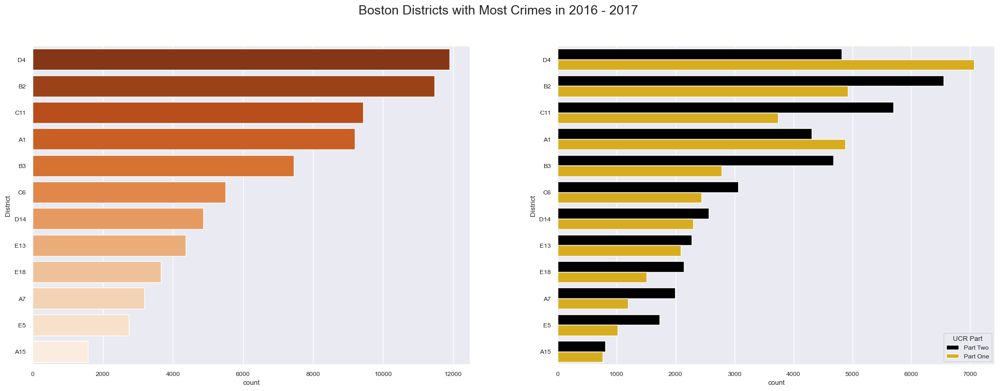

In [313]:
fig, (box1, box2) = plt.subplots(1, 2, figsize=(24, 8))
sns.set(font_scale=0.8)
plt.suptitle("Boston Districts with Most Crimes in 2016 - 2017",fontsize="18")
box1 = sns.countplot(ax=box1,data=df, y="District",palette ="Oranges_r", order = df["District"].value_counts().index)
box2 = sns.countplot(data=df, y="District",palette =police_line,hue="UCR Part", order = df["District"].value_counts().index)

# Focusing on the top 5 crime types in Boston.

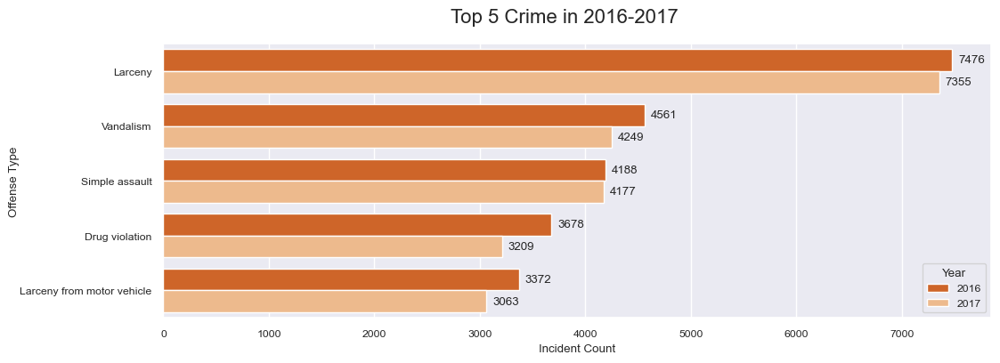

In [286]:
#Finding The Top 5 Crimes in 2016 - 2017
plt.figure(figsize=(12,4))
sns.set(font_scale=0.8)
plt.suptitle("Top 5 Crime in 2016-2017",fontsize="16")
ax = sns.countplot(data=df, y="Offense Type",palette ="Oranges_r", hue="Year", order = df["Offense Type"].value_counts().index[:5])
plt.ylabel ("Offense Type", labelpad = 0.01)
plt.xlabel("Incident Count")
ax.bar_label(ax.containers[0],padding=5)
ax.bar_label(ax.containers[1],padding=5)
plt.show()

Here we see the top 5 crimes in Boston in 2016-2017 along with the values of the most incidents for better context.

It appears larceny, even though it has slightly declined, remains to be the most common form of crime in the City of Boston. 

We can also learn that there is a trend of decline in the top 5 most common crimes.

In [287]:
#function for pie explode
def sizer (x,size):
       empty_list = []
       for i in range(x):
              empty_list.append(size)
       return empty_list

def spiraler (x,size):
       empty_list = [size]
       for i in range(x):
              add = empty_list[i] + 0.015
              empty_list.append(add)
       empty_list = empty_list[:-1]
       return empty_list

Text(0.5, 1.0, 'Top 5 Crime Percentage in Boston')

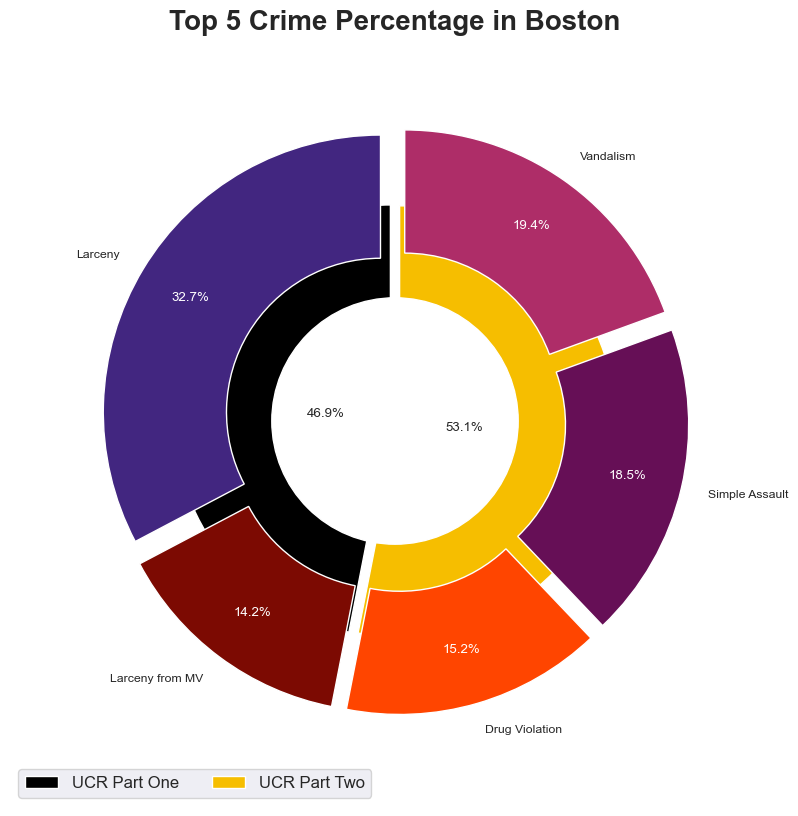

In [288]:
dfsunburst = df[["UCR Part", "Offense Type"]]
dfsunburst = dfsunburst.groupby(["UCR Part", "Offense Type"]).size().reset_index().rename(columns = {0:"Count"})
top5 = ["Larceny", "Larceny from motor vehicle", "Simple assault", "Drug violation", "Vandalism"]
dfsunburst = dfsunburst[dfsunburst["Offense Type"].isin(top5)].reset_index(drop=True)
dfsunburst

ucr = dfsunburst.groupby("UCR Part")["Count"].sum()
vals = dfsunburst["Count"]
labels1 = ["Larceny", "Larceny from MV","Drug Violation", "Simple Assault", "Vandalism"]
labels2 = ["UCR Part One","UCR Part Two"]
size = 0.3


title_font = {"family" : "sans-serif",
              "color":"black",
              "weight":"bold",
              "size":16}

fig, ax = plt.subplots(figsize=(10,10))
ax.pie(ucr, 
       radius=0.7, startangle=90, frame=True, colors= police_line,
       explode = sizer(2,0.015),
       autopct="%.1f%%", pctdistance=0.3,
       wedgeprops=dict(width=1, edgecolor='w'))

_,_, autotexts = ax.pie(vals, 
       radius=0.9, startangle=90, # size=0.3
       labels=labels1, colors=noyellow, explode=sizer(5,0.055),
       autopct="%.1f%%", pctdistance=0.8,
       wedgeprops=dict(width=0.4, edgecolor='w'))

for i in autotexts:
    i.set_color("white")

ax.legend(labels2,ncol=2, loc="lower left", frameon=True, prop={"size":12})
ax.add_artist(plt.Circle((0,0),0.4,color="white"))
plt.title("Top 5 Crime Percentage in Boston",fontsize=20,fontweight="bold",pad=1)



In [289]:
dfsunburst

,UCR Part,Offense Type,Count
0,Part One,Larceny,14831
1,Part One,Larceny from motor vehicle,6435
2,Part Two,Drug violation,6887
3,Part Two,Simple assault,8365
4,Part Two,Vandalism,8810


Larceny proves to be the number 1 crime in Boston with a 32.7% share of the top 5 crimes. 

Out of the Top 5 most frequent crimes in Boston, the majority of the crimes are UCR Part Two by a small margin.

### A Treemap of Top 5 Crimes in Boston City

In [290]:
top_5_offense = dfsunburst["Offense Type"].tolist()
dftreemap = df.groupby(["UCR Part", "Offense Type","Description"]).size().reset_index().rename(columns = {0:"Count"})
dftreemap = dftreemap[dftreemap["Offense Type"].isin(top5)]

dftreemap["Description"] = dftreemap["Description"].map(lambda x: x.lstrip("Drugs").lstrip(" -").replace("to mfr dist disp","")).str.capitalize()
dftreemap["Description"] = dftreemap["Description"].map(lambda x: x.lstrip("Larceny").lstrip(" ")).str.capitalize()
dftreemap["Description"] = dftreemap["Description"].map(lambda x: x.lstrip("Theft").lstrip(" ")).str.capitalize()
dftreemap

fig = px.treemap(dftreemap, path=[px.Constant("Crimes Breakdown"), "UCR Part", "Offense Type", "Description"],
                 values = "Count",
                 color = "Offense Type",
                 hover_data=["Count"],
                 color_continuous_scale="RdBu",
                 width=1200,
                 height=600,
                 title="Top 5 Crimes in Boston Sub Categories")
fig.update_traces(root_color="lightgrey")
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25),)

fig

From the treemap we have an insight of the various top 5 crimes as well as the subcategories within. 

The size of the boxes represent the number of occurences.

At a glance we see Larceny as the crime category with the biggest box and drug violation as the category with the most sub-categories.

## Larceny

In [291]:
#I made a function to create a smaller dataframe just to count the different types of crime per category. (I'm sure there's a simpler way but I couldn't find it.)
def desc_count(offense_type,description,offense_name):
    count = df[[offense_type,description]].value_counts()[offense_name]
    count_df = pd.DataFrame (data=count.index,columns=[description])
    count_df["Count"] = count.values
    return count_df

In [292]:
larceny_df = desc_count("Offense Type", "Description", "Larceny")
larceny_df["Label"] = ["Theft, Building", "Shoplifting", "Others", "Bicycle Theft", "Pick-Pocket", "Purse Snatch", "Coin Machine"]

larceny_df

,Description,Count,Label
0,Larceny theft from building,5293,"Theft, Building"
1,Larceny shoplifting,4593,Shoplifting
2,Larceny all others,3346,Others
3,Larceny theft of bicycle,1232,Bicycle Theft
4,Larceny pick-pocket,250,Pick-Pocket
5,Larceny purse snatch - no force,109,Purse Snatch
6,Larceny theft from coin-op machine,8,Coin Machine


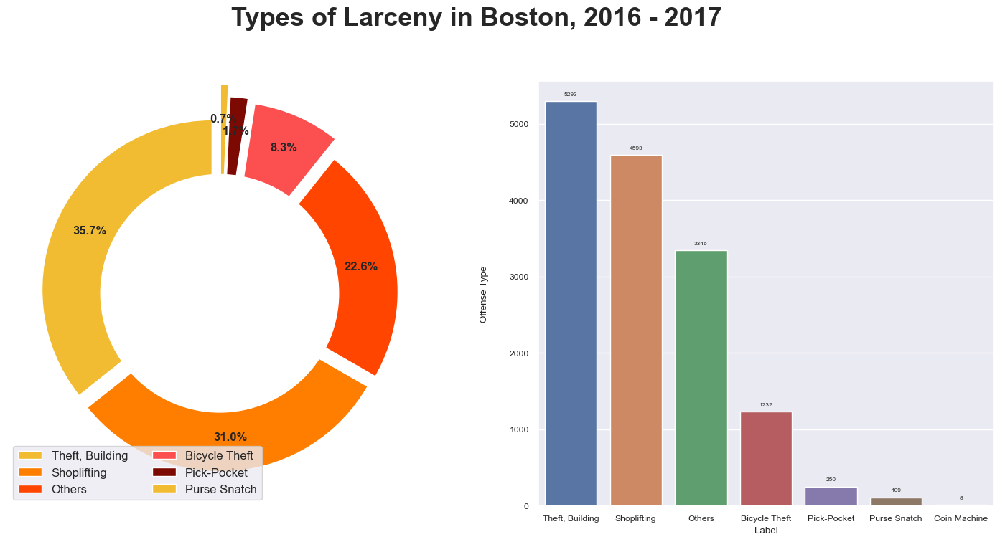

In [312]:
#Different Types of Larceny
fig, (box1, box2) = plt.subplots(1, 2, figsize=(18, 8))
plt.subplots_adjust(top=0.85)

#Plot 1
pies = larceny_df["Count"].head(6)
labels = larceny_df["Label"].head(6)
box1.pie(pies, explode=(0.05,0.05,0.05,0.14,0.16,0.23), colors= fire_r,startangle=90, labels = None, autopct="%.1f%%", pctdistance=0.8,textprops={"fontsize": 12,"weight":"bold"})
box1.add_artist(plt.Circle((0,0),0.7,color="white"))
fig.suptitle("Types of Larceny in Boston, 2016 - 2017",fontsize=26,fontweight="bold")
box1.legend(labels,ncol=2, loc="lower left", frameon=True, prop={"size":12})

#filtered df
df_larsony_only = df[df["Offense Type"] == "Larceny"]
df_larsony_only

#Plot 2

box2 =sns.barplot(data=larceny_df,x="Label", y="Count")

box2.set_ylabel("Offense Type",labelpad=20)
box2.bar_label(box2.containers[0],padding=5)

plt.show()
plt.clf()
plt.close()

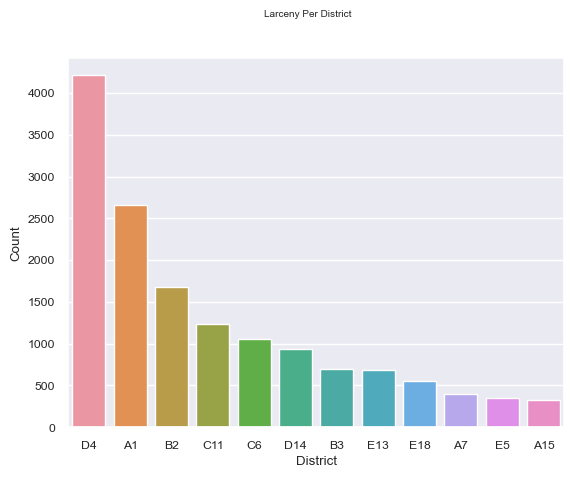

In [309]:
larceny_district_df = desc_count("Offense Type", "District", "Larceny")
larceny_district_df
plt.suptitle("Larceny Per District")
box2 =sns.barplot(data=larceny_district_df,x="District", y="Count")

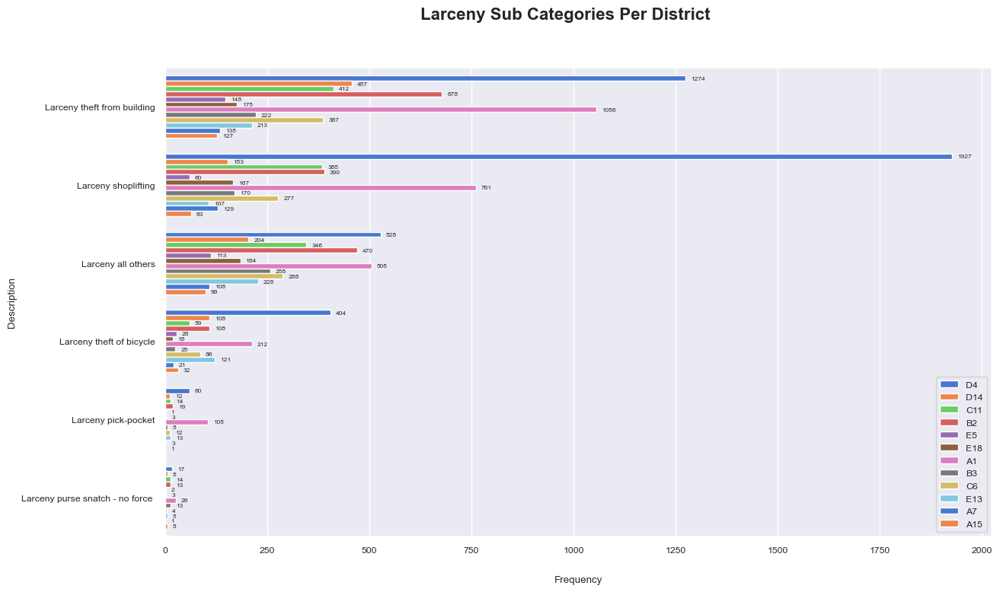

In [308]:
fig, ax = plt.subplots(figsize=(14,8))
order = df_larsony_only['Description'].value_counts().head(6).index
lar_cp =sns.countplot(data = df, y='Description',hue='District',palette="muted", order = order,  saturation=8,linewidth=1)
fig.suptitle("Larceny Sub Categories Per District",fontsize=16,fontweight="bold")
lar_cp.set_xlabel("Frequency",labelpad=20)
for i in range (12):
    lar_cp.bar_label(lar_cp.containers[i],padding=5)
    
lar_cp.legend(fontsize=1)
plt.rcParams['font.size'] = 6
plt.legend(loc="lower right")

Insights:
- From the donut chart we learn that theft from building is the most common form of larceny, making up 35.7% of all larceny incidents, followed closely by shoplifting crimes which makes up 31% and then by all others subcategory of larceny.

- It is important to establish early on that larceny theft from a building is different in definition as to shoplifting. In short, shoplifting is limited to theft from retail establishments and theft from a building is theft from within a building that is open to the general public and where the offender has legal access. "Theft From Buildings includes thefts from such places as churches, restaurants, schools, libraries, public buildings, and other public and professional offices during the hours when such facilities are open to the public. " 

- All other category includes: theft of animals, lawnmowers, tools, theft from fenced enclosures. (source: https://www.justia.com/criminal/docs/uniform-crime-reporting-handbook/larceny-theft/)

- From the bar chart showing the subcategories of larceny along with the districts, we learn that D4 is the district with most larceny crime, particularly shoplifting and theft from building, district A1 and district B2 follows respectively.

- Interestingly there is a noticably high amount of bicycle theft in area D4 and A1, perhaps the Boston Police Department could work together with The Boston Transportation Department to make safer public bike racks to increase quality of life of Bostonians.

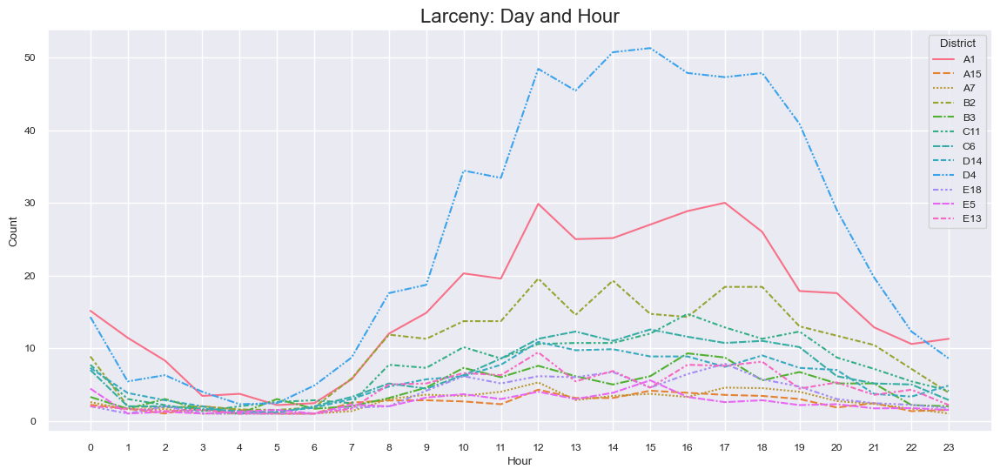

In [306]:
df_larceny_time = df[["Case ID", "Hour", "Day","District","Offense Type"]]
df_larceny_time = df_larceny_time[df_larceny_time["Offense Type"] == "Larceny"]

df_larceny_time = df_larceny_time.groupby(["Hour","Day","District"]).size().reset_index().rename(columns = {0:"Count"})
df_larceny_time
plt.figure(figsize=(14,6))
lp1 = sns.lineplot(x="Hour", y="Count", data=df_larceny_time, 
             hue="District", style="District",
             errorbar=None)
lp1.set_xticks(range(24))
plt.title("Larceny: Day and Hour",fontsize = 16)
sns.set_style("darkgrid")


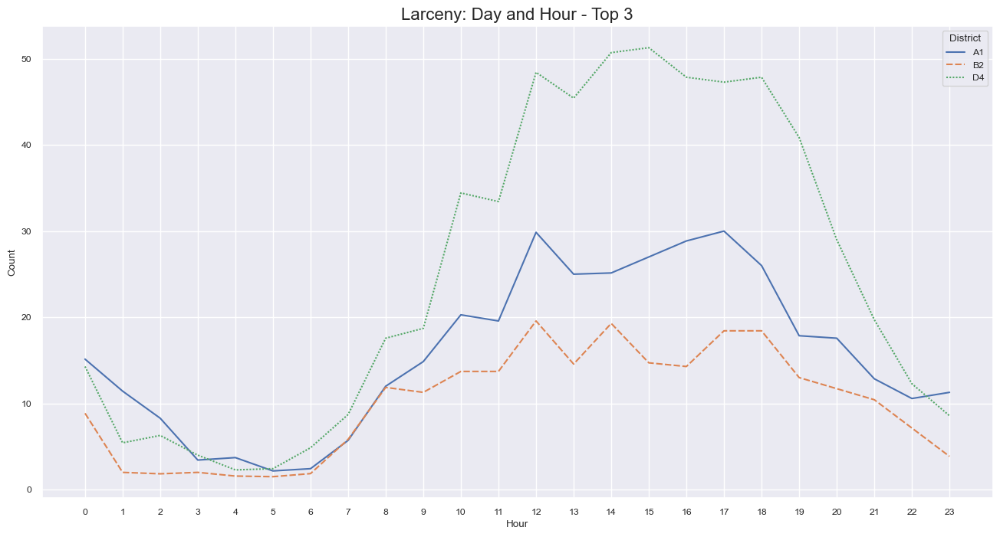

In [307]:
df_larceny_time = df[["Case ID", "Hour", "Day","District","Offense Type"]]
df_larceny_time = df_larceny_time[df_larceny_time["Offense Type"] == "Larceny"]

df_larceny_time = df_larceny_time.groupby(["Hour","Day","District"]).size().reset_index().rename(columns = {0:"Count"})
df_larceny_time
plt.figure(figsize=(16,8))
lp1 = sns.lineplot(x="Hour", y="Count", data=df_larceny_time[(df_larceny_time["District"] == "D4") | (df_larceny_time["District"] == "A1") | (df_larceny_time["District"] == "B2")], 
             hue="District", style="District",
             errorbar=None)
lp1.set_xticks(range(24))
plt.title("Larceny: Day and Hour - Top 3",fontsize = 16)
sns.set_style("darkgrid")


Insights:
- Based on the Larceny: Day and Hour line chart there is a very clear pattern of larceny activity per district and some overall patterns.

- We've identified there are lower crime activities in the early morning from 01:00 to 05:00, where there starts to show a gradual increase for some districts.

- Previously we've established that district D4 is the area with most larceny activities but from this line chart we notice there's a pattern that is similar to business operating hours:
    - Noticable crime increase in area D4, A1, and B2 at 07:00 - 10:00, which is similar to the opening hours of most businesses in Boston.

    - Spike in activity at 11:00 - 12:00, which is the common lunch hours in the US.

    - Relatively steady larceny activity throughout 12:00 - 18:00 and a gradual but steep decline starting from 18:00, which is the time most shops start to close in Boston until it reaches its lowest point at 23:00.

    - This pattern is further backed by the fact that the top three areas with larceny crimes; D4 (South End Boston), A1 (Downtown & Charlestown), and B2 (Roxbury), are all considered to be the high-end neighborhood in Boston with many business establishments. (source: https://zerodown.com/rankings/boston--ma/expensive)
    
    - Interestingly there is a spike of larceny activity on 00:00 in all districts and unfortunately this analyst could offer no explanation to this phenomenon.



In [298]:
df_larceny_map = df[["Case ID","Offense Type","Latitude","Longitude"]]
df_larceny_map = df_larceny_map[df_larceny_map["Offense Type"] == "Larceny"].dropna()
larc_loc = list(zip(df_larceny_map["Latitude"],df_larceny_map["Longitude"]))

m= folium.Map([42.351331, -71.078659],zoom_start=14,width="%100",height="%100",
              tiles="Stamen Toner")

for i in range (len(larc_loc)):
    folium.CircleMarker(location=larc_loc[i],radius=0.2,
                        color="green").add_to(m)
    
folium.CircleMarker (location=(42.351331, -71.078659),radius=50,
                     fill_color="red").add_to(m)

folium.CircleMarker (location=(42.357603, -71.057858),radius=100,
                     fill_color="blue").add_to(m)

42.357603, -71.057858

m

The green dots in the folium map above represents reported larceny crime locations that are complete with lattitude and longitude information. 

The smaller red circle shows the South End neighborhood of Boston, a part of the D4 crime district. This visualization tells us there are cases of larceny in almost every block in district D4, <u>**meaning almost every street in the neighborhood is a victim of larceny**</u>.

The larger blue circle highlights Boston Downtown area. Although it has far less counts of larceny if compared to area D4, area A1 is still the second district with most cases of larceny and <u>**it appears there is higher density of larceny crimes in area A1**</u>.

Suggestions:
*  **CCTV** - Building / business owners could install more visible CCTV, both for surveilance and to help dissuade any potential criminals. Boston PD could help by training said building / business owners and the city could work together with CCTV vendors to provide a lower price for small - medium businesses.

* **PERSONNELS** - Increase building guards, increase patrols, encourage civillian neighborhood patrol in partnership with Boston PD. 

* **SOCIALIZATION** - Sharing this information with businesses and other public places, particularly in larceny-frequent areas such as district D4, A1, B2, may very well increase awareness and vigilance of storekeepers and owners of public establishment in the area and perhaps deter and reduce larceny incidents. 

* Suggesting stores / public establishment managers to increase their business security is also highly recommended.

* Communication through media such as billboards and social media ads targetting the residents of the area, to increase awareness and invite them to participate in making their neighborhood safer by reporting, stopping, and ultimately reducing theft.

* **INCREASE POLICE PRESENCE** - Police patrols could be intensified to establish presence in the area and dissuade any potential criminals on **peak hours**, starting from 1000 - 1900 hours.

* **AREA A1** - Because larceny crime happens in closer proximity to one another, this analyst advises to create a patrol perimeter, virtually boxing district A1, and even stationing personnels in strategic larceny crime hotspots to provide swift action during criminal incidents.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


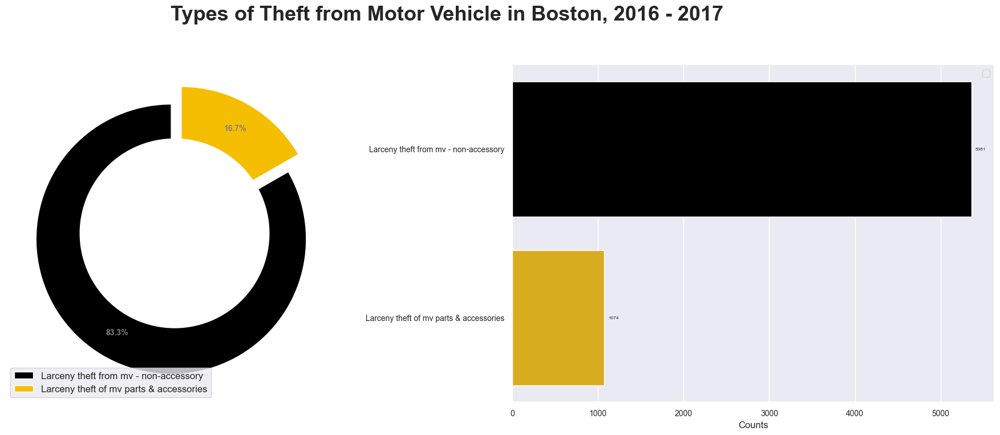

In [299]:
larceny_mv_df = desc_count("Offense Type", "Description", "Larceny from motor vehicle")

#Different Types of MV Larceny
fig, (box1, box2) = plt.subplots (1,2, figsize = (24,8))
box1.set_aspect ("equal","box")
fig.suptitle("Types of Theft from Motor Vehicle in Boston, 2016 - 2017",fontsize=26,fontweight="bold")
plt.subplots_adjust(top=0.85)


pies = larceny_mv_df["Count"]
labels = larceny_mv_df["Description"]
_,_, autotexts = box1.pie(pies, explode=(0.05,0.10), colors= police_line,startangle=90, labels = None, 
                          autopct="%.1f%%", pctdistance=0.8,textprops={"fontsize": 10,"weight":"bold"})
for i in autotexts:
    i.set_color("grey")
box1.add_artist(plt.Circle((0,0),0.7,color="white"))
box1.legend(labels,ncol=1, loc="lower left", frameon=True, prop={"size":12})

#filtered df
df_larceny_mv_only = df[df["Offense Type"] == "Larceny from motor vehicle"]

#Plot 2
order = larceny_mv_df['Description'].value_counts().head(6).index
box2 = sns.barplot(data=larceny_mv_df,x="Count", y="Description", palette=police_line)
box2.set(ylabel="")
box2.set_xlabel(xlabel = "Counts",fontsize=12)
box2.legend(fontsize=12,loc="best")
box2.tick_params (axis="both",labelsize=10)

box2.bar_label(box2.containers[0],padding=5)



plt.show()
plt.clf()
plt.close()

Text(0.5, 0.98, 'Larceny MV per district')

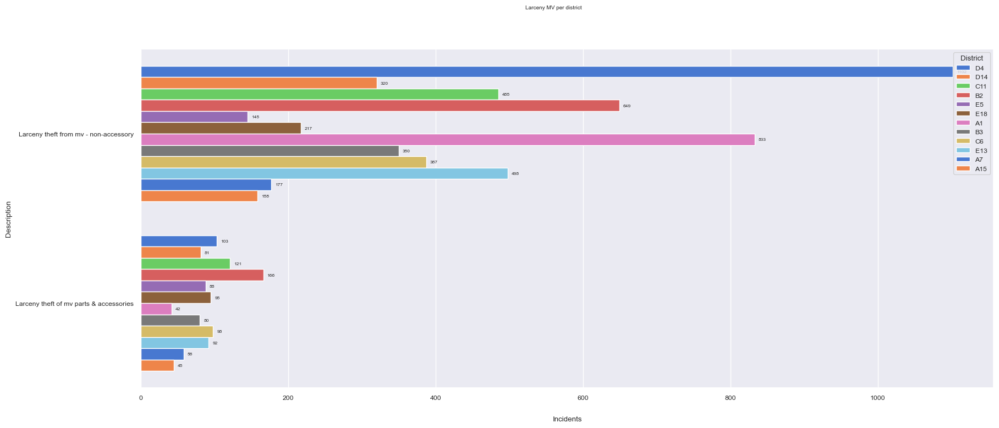

In [304]:
fig, ax = plt.subplots(figsize=(20,8))
larmv_cp = sns.countplot(data = df, y='Description',hue='District',palette="muted", order = order,  saturation=8,linewidth=1)
larmv_cp.set_xlabel("Incidents",labelpad=20)
for i in range(12):
    larmv_cp.bar_label(larmv_cp.containers[i],padding=5)
plt.suptitle("Larceny MV per district")

Theft from motor vehicles are divided into two categories: theft from the vehicle and theft of the vehicle accessories (rear mirrors, emblem, etc) and not theft of the motor vehicle itself.

From the data visualization above, we can see most types of larceny from motor vehicles are non-accessory thefts or theft of items within the vehicles, occuring 83.3% of the times of the total motor vehicle theft incidents.

Area D4 is where non-accessory MV theft happen the most and district B2 is where MV parts & accessories happen the most.

C:\Users\santo\AppData\Local\Temp\ipykernel_24420\2161304086.py:8: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




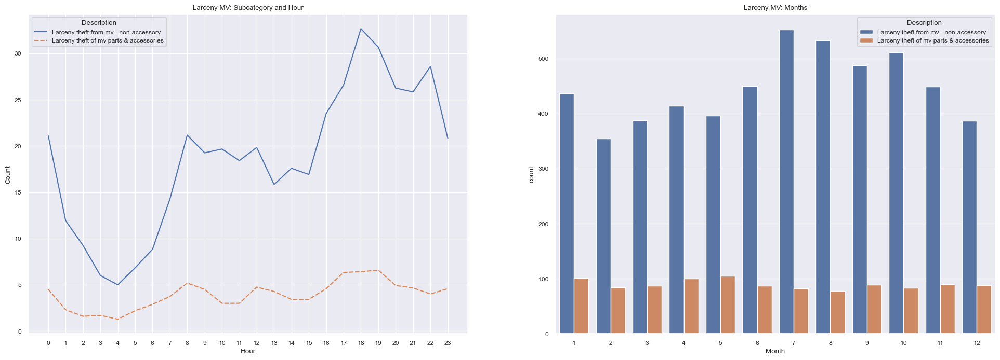

In [126]:
fig, (box1, box2) = plt.subplots(1, 2, figsize=(24, 8))

df_lmv_time = df[["Case ID", "Hour", "Day","District","Offense Type","Description","Month"]]
df_lmv_time = df_lmv_time[df_lmv_time["Offense Type"] == "Larceny from motor vehicle"]

df_lmv_time_line = df_lmv_time.groupby(["Hour","Month","Description"]).size().reset_index().rename(columns = {0:"Count"})
df_lmv_time_line
box1 = sns.lineplot(ax=box1,x="Hour", y="Count", data=df_lmv_time_line, 
             hue="Description", style="Description",
             ci=None)
box1.set_xticks(range(24))

box1.set_title("Larceny MV: Subcategory and Hour")

box2 = sns.countplot(data=df_lmv_time,x="Month", hue="Description").set_title("Larceny MV: Months")

sns.set_style("darkgrid")


#### Insights:
- Subcategory and hour lineplot shows us the lowest larceny from moving vehicle (LMV) and larceny of moving vehicle parts and accessories (LMV-PA) activity is at 04:00. 
- LMV activity gradually climbs until 06:00, where there's a spike until 08:00 and a steady climb and decline until 12:00. Other notable activity is at 16:00 where there is a sharp increase that peaks at 18:00 and gradually declines until the cycle restarts the next day.
- LMV - PA activities are relatively steady but constant. The peak is at 19:00.
- Peak month for LMV crimes are in June and lowest LMV incidents happen in February.

#### Suggestions:
- Many neighborhoods in Boston do not have garages which leaves car owners no choice but to park on roadsides.
- For LMV, prevention could prove to be more effective in reducing the crime. Boston Police Department could have a public service campaign, reminding car owners to park responsibly and to not leave valuable items in areas that are visible from outside the vehicle. Area D4, E5, and B2 could be focused on as they are the areas with most LMV incidents.
- Installing or promoting civillians to install surveillance cameras in districts with high LMV frequency could also prove effective.

## Drug Violations

In [127]:
#Drug class adder
def drug_class (desc):
    if "class b" in desc: return "Class B" 
    
    elif "class a" in desc: return "Class A"
    
    elif "class c" in desc: return "Class C"
    
    elif "class d" in desc: return "Class D"
    
    elif "class e" in desc: return "Class E"
    
    else:
        return "Others"
    
def drug_crime_label (desc):
    if "- intent" in desc:
        return "Intent"
    
    if "Sale" in desc:
        return "Intent"
    
    elif "other" in desc:
        return "Other"
    
    elif "Consp to viol controlled substance" in desc:
        return "Other"
    
    else: 
        return "Posession"
    

In [128]:
#Classifying drug type & renaming for conciseness.
drug_vio_df = desc_count("Offense Type", "Description", "Drug violation")
drug_vio_df['Description'] = drug_vio_df['Description'].map(lambda x: x.lstrip('Drugs').lstrip(' -').replace('to mfr dist disp','')).str.capitalize()
drug_vio_df["Drug Type"] = drug_vio_df["Description"].apply(drug_class)
drug_vio_df ["Crime Type"] = drug_vio_df["Description"].apply(drug_crime_label)
drug_vio_df2= drug_vio_df.pivot_table("Count",["Drug Type","Crime Type"])
drug_vio_df2



Count
Drug Type Crime Type            
Class A   Intent      624.000000
          Posession   608.000000
Class B   Intent      894.000000
          Posession   858.000000
Class C   Intent       74.000000
          Posession   178.000000
Class D   Intent      345.000000
          Posession   407.000000
Class E   Intent       40.000000
          Posession   217.000000
Others    Intent      893.000000
          Other       131.666667
          Posession   338.500000

Offense Type "Drug violation" is a tricky one because it has so many sub categories and further data wrangling is required for better visualization. 

[Text(5, 0, '616'),
 Text(5, 0, '876'),
 Text(5, 0, '126'),
 Text(5, 0, '376'),
 Text(5, 0, '128.5'),
 Text(5, 0, '330.25')]

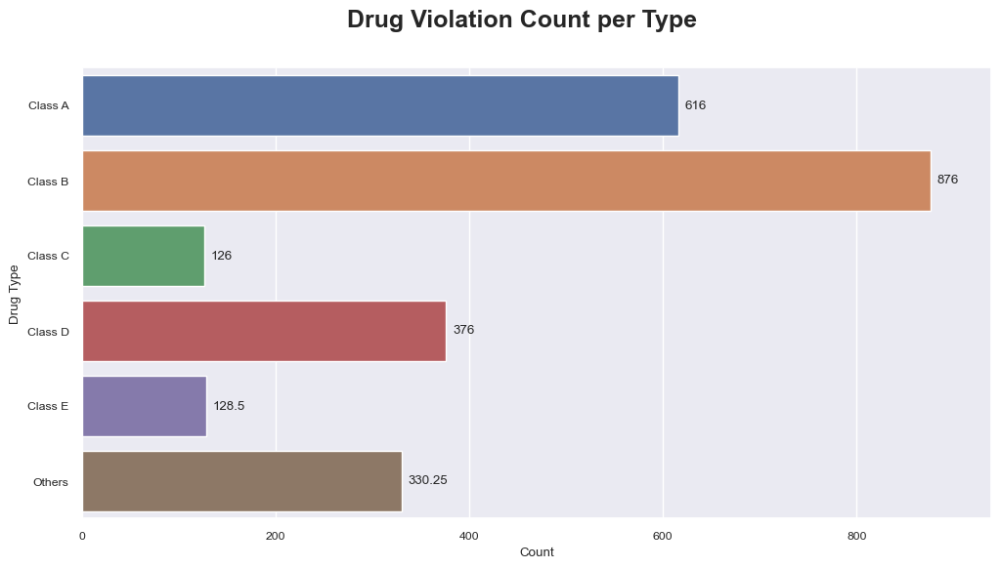

In [148]:
fig, ax = plt.subplots(figsize=(12,6))
fig.suptitle("Drug Violation Count per Type",fontsize=18,fontweight="bold")
ax1 = sns.barplot(data=drug_vio_df.sort_values("Drug Type"),x="Count", y="Drug Type",errwidth=0)
ax1.bar_label(ax1.containers[0],padding=5)

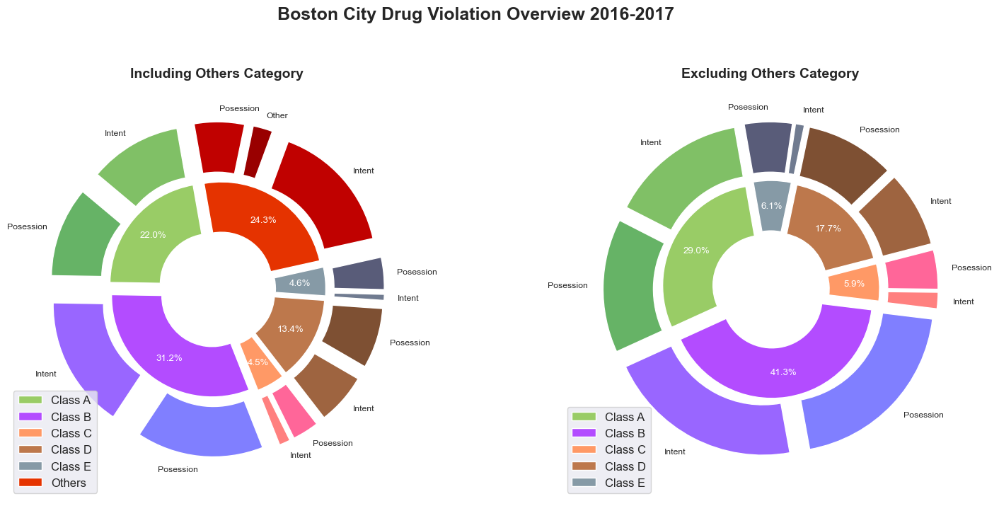

In [130]:
#Box 1
crime_type = drug_vio_df2.groupby("Drug Type")["Count"].sum()
vals1 = drug_vio_df2["Count"]
labels1 = ["Class A", "Class B", "Class C", "Class D", "Class E", "Others"]
labels2 = ["Intent","Posession","Intent","Posession","Intent","Posession","Intent","Posession","Intent","Posession","Intent","Other","Posession",]

#Box 2
drug_vio_no_others = drug_vio_df[drug_vio_df["Drug Type"] != "Others"]
drug_vio_no_others_pivot = drug_vio_no_others.pivot_table("Count",["Drug Type","Crime Type"])
crime_type2 = drug_vio_no_others_pivot.groupby("Drug Type")["Count"].sum()
vals2 = drug_vio_no_others_pivot["Count"]
labels3 = ["Class A", "Class B", "Class C", "Class D", "Class E"]
labels4 = ["Intent","Posession","Intent","Posession","Intent","Posession","Intent","Posession","Intent","Posession"]

size = 0.3
explode = (0.02,0.02)



a,b,c,d,e,f,g,h,i = [plt.cm.winter, plt.cm.cool, plt.cm.spring, plt.cm.copper, plt.cm.bone, plt.cm.gist_heat, plt.cm.pink, plt.cm.summer, plt.cm.autumn]

outer_colors = [h(.6), b(.7), c(.6), d(.6), e(.6), f(.6)]
inner_colors = [h(.5), h(.4), 
                b(.6), b(.5),
                c(.5), c(.4),
                d(.5), d(.4),
                e(.5), e(.4),
                f(.5), f(.4), f(.5)]

title_font = {"family" : "sans-serif",
              "color":"black",
              "weight":"bold",
              "size":16}



fig, (box1, box2) = plt.subplots(1, 2, figsize=(20, 8))
plt.subplots_adjust(top=0.85)

fig.suptitle("Boston City Drug Violation Overview 2016-2017",fontsize=18,fontweight="bold")

_,_, autotexts = box1.pie(crime_type, 
       radius=0.6, startangle=100, # size=0.3
       autopct="%.1f%%", pctdistance=0.75,
       
       colors=outer_colors, explode= sizer(6,0.05),
       wedgeprops=dict(width=size, edgecolor='w'))

box1.pie(vals1, 
       radius=0.8, startangle=100, 
       labels=labels2,
       labeldistance=1.1,
       frame=True, colors= inner_colors,
       explode = sizer (13,0.2), 
       wedgeprops=dict(width=0.3, edgecolor='w'))

_,_, autotexts2 = box2.pie( crime_type2,
       radius=0.6, startangle=100, # size=0.3
       autopct="%.1f%%", pctdistance=0.75,
       colors=outer_colors, explode= sizer(5,0.05),
       wedgeprops=dict(width=size, edgecolor='w'))


box2.pie(vals2, 
       radius=0.9, startangle=100, frame=True, labels=labels4, colors= inner_colors,
       explode = sizer (10,0.1), wedgeprops=dict(width=0.3, edgecolor='w'))


for i in autotexts:
    i.set_color("white")
    
for i in autotexts2:
    i.set_color("white")

box1.legend(labels1,ncol=1, loc="lower left", frameon=True, prop={"size":12})
box1.add_artist(plt.Circle((0,0),0.2,color="white"))
box1.set_title("Including Others Category",fontsize=14,fontweight="bold",pad=1)

box2.set_title("Excluding Others Category",fontsize=14,fontweight="bold",pad=1)
box2.add_artist(plt.Circle((0,0),0.2,color="white"))
box2.legend(labels3,ncol=1, loc="lower left", frameon=True, prop={"size":12})

plt.subplots_adjust(wspace=0.02)



Initial finding shows that "Others" are the most common drug violation related incident, which is not a surprise considering it is a combination of various drug - related incidents.

Others include:
* Sick assist - assistance request due to sickness caused by drugs (could include overdosing)
* Posession - posession of drugs but not specified.
* Posession of drug paraphanalia - making up a very small amount of "Others" category but too significant to remove.

If we put aside the "Others" category we can see the five main drug abuse type in the following rank:
* Class B Drugs - Cocaine, Ecstacy, Amphetamines, LSD, PCP, Methamphetamines, and Oxycodone makes up the most of the drug types in drug related crime in Boston nearly a 1:1 ratio between intent to sell and posession.
* Class A Drugs - Heroin, GHB, Morphine, and Ketamine is number two most types of drugs with nearly a 1:1 ratio between intent to sell and posession.
* Class D Drugs - Marijuana and Phenobarbital. The ratio between possession and intent to sell is also similar.
* Class E Drugs - Prescription drugs with weaker amounts of Codeine, Morphine, and other Opiates. There are 5 times more intent to distribute / manufacture than posess which makes it stand out than the other drugs. I'm not quite sure what type of drugs / brand are listed to be in Class E drugs but if more buyers than sellers are arrested, maybe the sellers aren't as obvious as other drug dealers, such as pharmacy workers.
* Class C Drugs - Prescription drugs such as Valium, Vicodin, Psilocybin / Mushrooms. Again, this category has more users than sellers, similar to Class E drugs which is also a category that includes prescription medicine. This data analyst thinks this is an anomaly and further investigation is suggested.

source: https://criminal.attorneywdkickham.com/controlled-substances-act-list.html

C:\Users\santo\AppData\Local\Temp\ipykernel_24420\1930467327.py:10: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




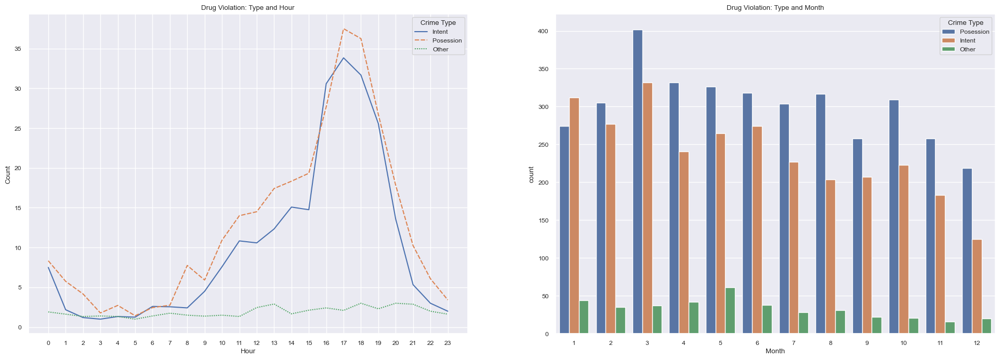

In [157]:
df_drug_time = df[["Case ID", "Hour", "Day","District","Offense Type","Description","Month","Year"]]
df_drug_time = df_drug_time[df_drug_time["Offense Type"] == "Drug violation"]
df_drug_time['Description'] = df_drug_time['Description'].map(lambda x: x.lstrip('Drugs').lstrip(' -').replace('to mfr dist disp','')).str.capitalize()
df_drug_time["Drug Type"] = df_drug_time["Description"].apply(drug_class)
df_drug_time ["Crime Type"] = df_drug_time["Description"].apply(drug_crime_label)

df_drug_time_line = df_drug_time.groupby(["Hour","Month","Crime Type"]).size().reset_index().rename(columns = {0:"Count"})

fig, (box1, box2) = plt.subplots(1, 2, figsize=(24, 8))
box1 = sns.lineplot(ax=box1,x="Hour",
                    y="Count", data=df_drug_time_line, 
             hue="Crime Type", style="Crime Type",
             ci=None)
box1.set_xticks(range(24))
box1.set_title("Drug Violation: Type and Hour")

box2 = sns.countplot(ax=box2,data=df_drug_time, x="Month", hue="Crime Type")
box2.set_title("Drug Violation: Type and Month")
sns.set_style("darkgrid")

Insights:
- There's a similar pattern between frequencies of drug posession (DP) and drug posession with intent (DPI) violations.
- There is relatively low incidents in early morning hours until 08:00, where there appears to be a gradual increase until 15:00, where there's a drastic spike and peaks crime at 17:00.
- This analys initially assumed that drug violation activities would peak during Summer, but it turns out the highest DP activity is in March, the first month of Spring and the lowest is in December.
- Generally there are more DP cases than DPV with the exception of January, the only month that has more DPV cases than DP.
- Peak DPV crime frequency is also in March -this made me curious about the pattern between 2016 - 2017.

<AxesSubplot: title={'center': 'Drug Violation: Type and Year'}, xlabel='Month', ylabel='count'>

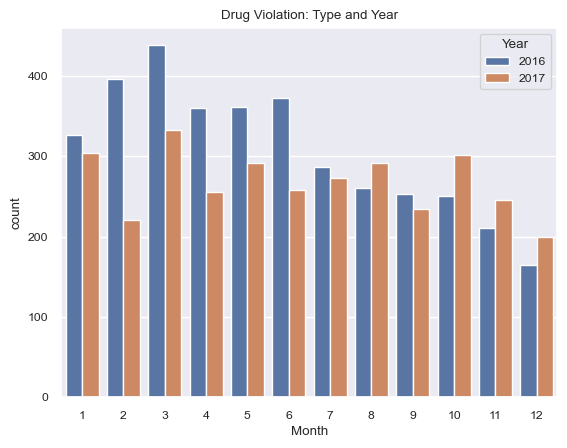

In [152]:
box2 = sns.countplot(data=df_drug_time, x="Month", hue="Year")
box2.set_title("Drug Violation: Type and Year")
sns.set_style("darkgrid")
box2

- There is an obvious decrease in drug violations in 2017, barring from August and October where there is an increase, and yet March remains to be the month with most drug violation crimes. 
- This analyst is unsure if the peak in March is a coincidense or not but it definitely warrants further investigation.

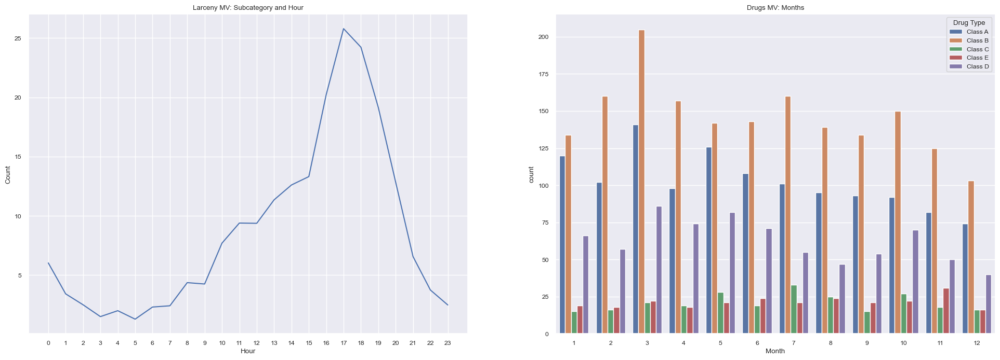

In [159]:
fig, (box1, box2) = plt.subplots(1, 2, figsize=(24, 8))

df_drug_time = df_drug_time[df_drug_time["Drug Type"] != "Others"]


box1 = sns.lineplot(ax=box1,x="Hour", y="Count", data=df_drug_time_line, 
              
             errorbar=None)
box1.set_xticks(range(24))

box1.set_title("Larceny MV: Subcategory and Hour")

box2 = sns.countplot(data=df_drug_time,x="Month", hue="Drug Type").set_title("Drugs MV: Months")

sns.set_style("darkgrid")

In [134]:
#filtered df
df_drug_vio_only = df[df["Offense Type"] == "Drug violation"]
df_drug_vio_only['Description'] =df_drug_vio_only['Description'].map(lambda x: x.lstrip('Drugs').lstrip(' -').replace('to mfr dist disp','')).str.capitalize()
df_drug_vio_only["Drug Type"] = df_drug_vio_only["Description"].apply(drug_class)
df_drug_vio_only ["Crime Type"] = df_drug_vio_only["Description"].apply(drug_crime_label)
df_drug_vio_only = df_drug_vio_only[df_drug_vio_only["Drug Type"] != "Others"]
df_drug_vio_only

,Case ID,Offense Type,Description,District,Date,Year,Month,Season,Day,Hour,UCR Part,Latitude,Longitude,Drug Type,Crime Type
66455,I172107486,Drug violation,Poss class a - intent,A1,2017-12-31 01:23:00,2017,12,Winter,Sunday,1,Part Two,42.351066,-71.065496,Class A,Intent
66540,I172107392,Drug violation,Poss class b - intent,C6,2017-12-30 13:30:00,2017,12,Winter,Saturday,13,Part Two,42.331521,-71.070853,Class B,Intent
66542,I172107389,Drug violation,"Poss class b - cocaine, etc.",C6,2017-12-30 15:56:00,2017,12,Winter,Saturday,15,Part Two,42.331521,-71.070853,Class B,Posession
66545,I172107385,Drug violation,Poss class b - intent,C6,2017-12-30 15:10:00,2017,12,Winter,Saturday,15,Part Two,42.332223,-71.071672,Class B,Intent
66763,I172107142,Drug violation,"Poss class b - cocaine, etc.",A1,2017-12-29 13:50:00,2017,12,Winter,Friday,13,Part Two,42.339542,-71.069409,Class B,Posession
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318815,I142051855-00,Drug violation,"Poss class b - cocaine, etc.",E13,2016-02-22 18:30:00,2016,2,Winter,Monday,18,Part Two,42.322914,-71.103284,Class B,Posession
318854,I142033219-00,Drug violation,"Poss class a - heroin, etc.",D4,2016-01-04 17:20:00,2016,1,Winter,Monday,17,Part Two,42.335119,-71.074917,Class A,Posession
318913,I140346143-00,Drug violation,"Poss class b - cocaine, etc.",E18,2017-01-07 20:00:00,2017,1,Winter,Saturday,20,Part Two,42.275313,-71.115878,Class B,Posession
318918,I140311903-00,Drug violation,Poss class d - intent,D4,2016-03-07 18:45:00,2016,3,Spring,Monday,18,Part Two,42.333489,-71.080642,Class D,Intent


Text(0, 0.5, 'Drug Type')

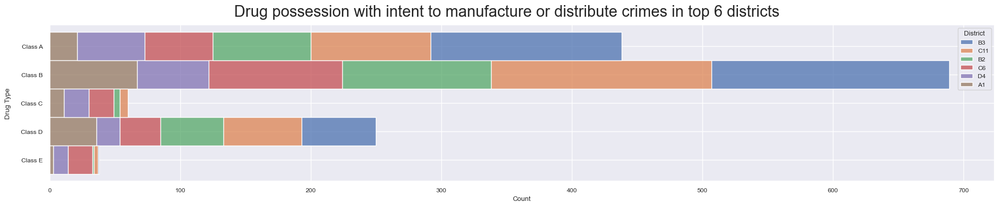

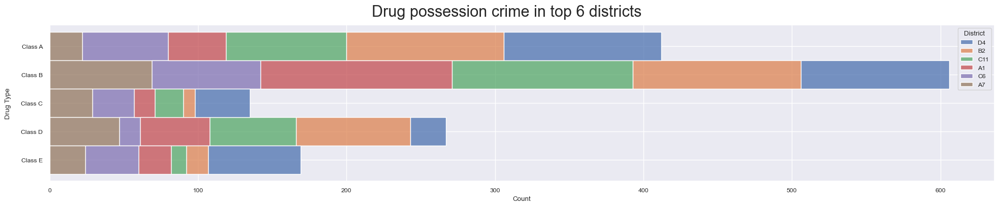

In [135]:
#Sellers
df_drug_intent_district = df_drug_vio_only[df_drug_vio_only["Crime Type"] != "Posession"]

df_drug_intent_district["Drug Type"] = pd.Categorical(df_drug_intent_district["Drug Type"], 
                                                      ordered=True, 
                                                      categories=["Class A","Class B","Class C","Class D","Class E"])
plt.figure(figsize=(24,4))
plt.suptitle("Drug possession with intent to manufacture or distribute crimes in top 6 districts",
             fontsize=22)

sns.histplot(data = df_drug_intent_district, 
             y =df_drug_intent_district["Drug Type"],
             hue=df_drug_intent_district["District"],
             multiple="stack",
             hue_order=df_drug_intent_district["District"].value_counts().index[:6],palette="deep")

plt.ylabel ("Drug Type", labelpad = 14)

#Posession
df_drug_posession_district = df_drug_vio_only[df_drug_vio_only["Crime Type"] != "Intent"] 

df_drug_posession_district["Drug Type"] = pd.Categorical(df_drug_posession_district["Drug Type"], 
                                                      ordered=True, 
                                                      categories=["Class A","Class B","Class C","Class D","Class E"])
plt.figure(figsize=(24,4))
plt.suptitle("Drug possession crime in top 6 districts",
             fontsize=22)

sns.histplot(data = df_drug_posession_district, 
             y =df_drug_posession_district["Drug Type"],
             hue=df_drug_posession_district["District"],
             multiple="stack",
             hue_order=df_drug_posession_district["District"].value_counts().index[:6])

plt.ylabel ("Drug Type", labelpad = 14)

Above are two histplots, one focusing on drug posession crimes and the other on sales and manufacturing, both displaying the distribution of drugs categorized by class and by top 6 districts with most frequency.

The most insightful finding from the chart is that most drug manufacturing / distribution crimes happens in district B3, while district B3 is not even included in top 6 districts with drug posession crime due to low frequency. This insight might indicate more drug-distribution activities in district B3 that requires special attention from Boston PD, particularly the anti-drugs task force.

District rank number 1 in drug possession crime is district D4, which is rank 5 in drug manufacturing / distribution crimes which means there are far more sellers than users in that area. Further insight could be made if matched with data of D4 resident demographics.

On the surface, it seems most of the buyers are residents of higher-end neighborhoods and the sellers are those in the outskirt neighborhoods of boston.

This initial insight made me curious of the user - seller ratio.

Text(0, 0.5, 'Frequency')

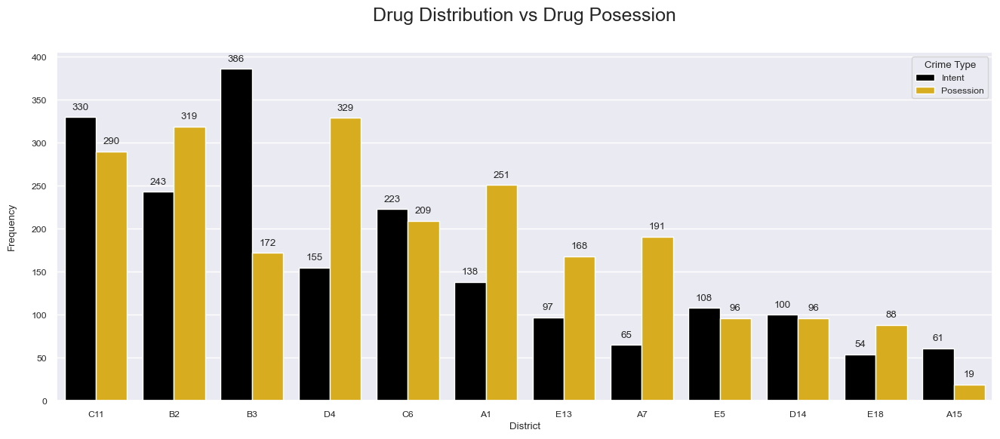

In [141]:
plt.figure(figsize=(16,6))
sns.set(font_scale=0.8)
plt.title("Drug Distribution vs Drug Posession",
             fontsize=18, pad=30)
ax=sns.countplot(data=df_drug_vio_only, x="District",palette =police_line, hue="Crime Type", order = df_drug_vio_only["District"].value_counts().index)
ax.bar_label(ax.containers[1],padding=5)
ax.bar_label(ax.containers[0],padding=5)
plt.ylabel ("Frequency", labelpad = 14)

For clarification: 
* "Intent" here is short for "Drug posession with intent to manufacture and distribute".
* Drug posession is considered to be for self-use if it is within the amount set by State law. In other words the drugs are intended for use.
* Drug posession is considered to be intended to be manufactured and / or distributed if the amount of drugs are for more than self-use. In other words the drugs are intended to sell.

Source: https://www.georgiacriminaldefense.com/possession-with-intent-to-distribute.html#:~:text=Intent%20to%20distribute%20is%20drug,as%20intent%2C%20not%20just%20possession.




Insights:
* District C11 has most case of drug violations but almost has a balanced occurence between distribution & posession drug related crime.
* District B2 is the 2nd most drug violations-frequent district with slightly more users than sellers.
* District B3 is the 3rd most drug violation-frequent district with significantly more sellers than users. It is highly recommended for this district to be focused on by Boston PD to understand why there is an outstanding amount of drug distributors. 
* District A1, E13, A7 also has significantly more distributors than users, investigation is advised.
* District C6, E5, and D14 has a relatively balanced user - distributor ratio, moderate manpower allocation is advised alongside drug education and / or rehabilitation programs.
* Although district A15 has least drug violation incidents, drug education and / or rehabilitation programs are strongly advised, considering there are far more users than sellers in that area.

## Vandalism

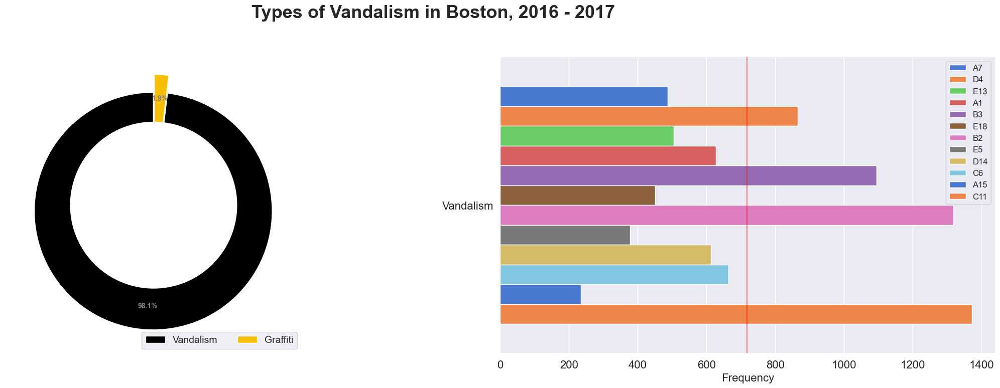

In [143]:
vandalism_df = desc_count("Offense Type", "Description", "Vandalism")

#Different Types of Vandalism
fig, (box1, box2) = plt.subplots (1,2, figsize = (28,8))
box1.set_aspect ("equal","box")
fig.suptitle("Types of Vandalism in Boston, 2016 - 2017",fontsize=26,fontweight="bold")
plt.subplots_adjust(top=0.85)


pies = vandalism_df["Count"]
labels = vandalism_df["Description"]
_,_, autotexts = box1.pie(pies, explode=(0.05,0.10), colors= police_line,startangle=90, labels = None, autopct="%.1f%%", pctdistance=0.8,textprops={"fontsize": 10,"weight":"bold"})
for i in autotexts:
    i.set_color("grey")
box1.add_artist(plt.Circle((0,0),0.7,color="white"))
box1.legend(labels,ncol=2, loc="lower right", frameon=True, prop={"size":14})

#filtered df
df_vandalism_only = df[df["Description"] == "Vandalism"]

#Plot 2
order = df_vandalism_only['Description'].value_counts().sort_values().index
box2 = sns.countplot(data = df_vandalism_only, y='Description',hue='District',palette="muted", order = order,  saturation=8,linewidth=1)
box2.set(ylabel="")
box2.set_xlabel(xlabel = "Frequency",fontsize=16)
box2.legend(fontsize=12)
box2.tick_params (axis="both",labelsize=16)
box2.axvline(df_vandalism_only.groupby("District").count().mean()["Case ID"] #The mean line
             ,alpha=0.5, c="red")


plt.show()
plt.clf()
plt.close()

Unfortunately, as the visualization suggests, the information on vandalism is limited to Graffiti and vandalism itself. With 98.1% uncategorized and undetailed data there is not much that can be analyzed, considering vandalism itself covers various types of crime such as trash dumping, light smashing, public sign damage, damaged windows, etc.

The suggestion that this analyst could offer is not on how to handle the crime, but to better handle and categorize the data so we can know and understand better the various nature of the problem and develop a strategic approach to handling it.

District above average vandalism frequency:
* C11
* B2
* B3
* D4

Suggestions for improvement:
* Further classify the nature of the vandalism (building damage, public property damage).
* Encourage complaint handler to further question the type of vandalism.
* Approach the people of Boston to care more for their community by preventing and reporting vandalism, considering it also involves the damaging of public property bought by their tax money.
* Districts with above average vandalism frequency could be focused on.

## Simple Assault

In [138]:
simple_assault_df = desc_count("Offense Type", "Description", "Simple assault")
simple_assault_df

,Description,Count
0,Assault simple - battery,7951
1,Assault - simple,382
2,Stalking,32


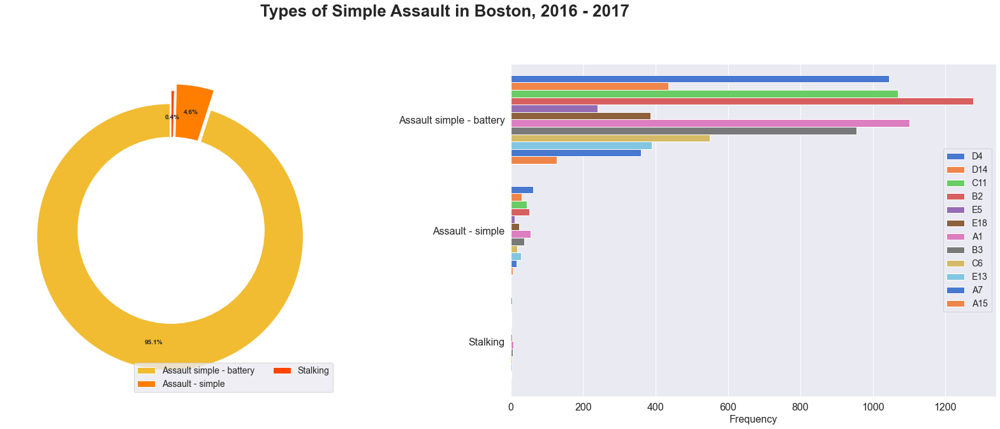

In [116]:

simple_assault_df = desc_count("Offense Type", "Description", "Simple assault")

#Different Types of Vandalism
fig, (box1, box2) = plt.subplots (1,2, figsize = (30,10))
box1.set_aspect ("equal","box")
fig.suptitle("Types of Simple Assault in Boston, 2016 - 2017",fontsize=26,fontweight="bold")
plt.subplots_adjust(top=0.85)


pies = simple_assault_df["Count"]
labels = simple_assault_df["Description"]
box1.pie(pies, explode=(0.05,0.10,0.05), colors= fire_r,startangle=90, labels = None, autopct="%.1f%%", pctdistance=0.8,textprops={"fontsize": 10,"weight":"bold"})
box1.add_artist(plt.Circle((0,0),0.7,color="white"))
box1.legend(labels,ncol=2, loc="lower right", frameon=True, prop={"size":14})

#filtered df
df_simple_assault_only = df[df["Offense Type"] == "Simple assault"]

#Plot 2
order = df_simple_assault_only['Description'].value_counts().head(6).index
box2 = sns.countplot(data = df, y='Description',hue='District',palette="muted", order = order,  saturation=8,linewidth=1)
box2.set(ylabel="")
box2.set_xlabel(xlabel = "Frequency",fontsize=16)
box2.legend(fontsize=14)
box2.tick_params (axis="both",labelsize=16)


plt.show()
plt.clf()
plt.close()

According to https://www.shouselaw.com/ca/blog/assault-vs-battery/, simple assault is less serious than assault with battery.

There are more cases of assault with battery in Boston 2016-2017 with district B2 as the area with most cases, followed by district A1, C11, and D4.

Since simple assault is a crime of a more interpersonal nature that could be committed to strangers, friends, and even family members, it is complicated to prevent from happening.

If the city or Boston PD wishes to focus their efforts in reducing simple assault crimes they could do so through partnership with nonprofit organizations focusing on harassment such as Stop Street Harassment (https://stopstreetharassment.org/about/) and focus their campaigns on the districts with most assault crimes.

# Crimes in Boston Summary

From the EDA we have come up with some insights that we could pair with actionable recommendations.

#### There has been a reduction in crime occurences in Boston in 2017 from 2016.
Crime rate has somewhat decreased although there are some crimes that have increased such as:
- Harassment
- Disorderly conduct
- Commercial Burglary
- Balistics
- Liquor Violation
- Embezzlement
- Prostitution
- Prisoner related incidents

These crimes could be subject to consideration.


#### The Time of Crime
In terms of crime and hours of the day we have learned that:
- Lowest crime activity is at 05:00.
- There is an increasee in crime activity starting from 06:00.
- Peak crime activity is at 17:00 - 18:00.

With this insight, we propose an increase in law enforcement presence during the peak hours (10:00 - 21:00) which have an effect in reducing crime frequency during those hours. 

In terms of month and season we have learned that:
- There is a decrease in crime rate per month from 2016.
- August remains to be the month with the highest crime rate in 2017.
- There is a decrease in crime rate per season from 2016.
- Summer remains to be the season with the highest crime rate in 2017.

Considering Summer months have more crime activities, crime reduction efforts could be focused during those months. We also suggest to put into consideration the school summer break, which lasts 12 weeks through the entire Summer.

#### Crime Density
The crime geo heatmap density visualization tells us that Part One crimes are more centralized in the Downtown area and gradually dissipates as it spreads to Boston Borders.

Part Two crimes have multiple hot spots and crime reduction efforts could be focused on those areas, specifically:

- Downtown Boston
- Harington Avenue
- Blue Hill Avenue

Increased Police presence in crime hotspots are advisable.
Considering larceny is the most prevalent crime in Boston, increased surveillance in the area could help with crime prevention. 

#### Crimes to Focus On
If Boston Police Department were to focus on one type of crime to significantly reduce the overall crime rate in Boston it would be Larceny.

- Larceny is most frequent in district D4 and A1 and the most frequent type of larceny is shoplifting and theft from building. 
- Considering area D4 is a combination of residential areas, stores, and shopping malls with many public alleys, increased surveillance and cooperation between neighborhood watches and private security firms could prove to be beneficial. 
- The many crossroads of area D4 could be used to mount surveillance cameras in crime prone areas. 
- Area A1 is Downtown Boston which consists of not only offices spaces and entertainment areas but also many historical sites such as the Old State House, Boston City Hall, Samuel Adams statue, which means traffic in this area consists both of Boston residents as well as tourists.
- Theft from building and shoplifting are also high in this area, and considering crime activity is at its height during after hours, heightened on-foot security presence per block is advisable to deter and apprehend.
- Pick-pocket and purse snatch is highest in this area, warning to visitors in areas with high traffic is recommended.

#### Drug Violation
Drug violation is ranked 4 in the top 5 crimes of Boston and due to its long-lasting effects on society, focus on this crime type is highly recommended.

- D4 is the district with the highest drug posession crime count (Drug Class A - E)
- B3 is the district with the highest drug posession with intent to sell count, followed by C11 (Drug Class A - E)
- Considering the district with most drug posession crime count is Boston's Downtown area, increased random drug checkpoints could be implemented in streets with many entertainment establishments and on street chokepoints.
- District B3 and B11 are residential districts consisting mostly of houses, schools, aand universities. Police drug operations could be focused on thse two areas as they contribute most to drug posession with intent crimes. Undercover operations could be considered due to the nature of the neighborhood.
- District B3 has highest seller to user ratio, regular sting operations advised as well as drug check checkpoints in major roads leading into the district.
- Considering district C11 is the district with second highest intent to distribute crime count, hosts a harbor, and is adjacent to B3, regular deployment of K9 drug detection units at the harbor area is recommended as it could prove to be an entry point.
- The amount of posession crimes and intent to sell crimes are relatively balanced for all drug classes with the exception of drug class D and E.
- It could be taken into consideration that drug class D and E are also available in pharmacies with prescriptions, which might also be an overlooked source of drug class D and E.  

#### Other Suggestions
- More attention to information entry as there are many entries that does not follow template and has typos.

- Clarification of "Shooting" column. It is advisable to input "None" or "N" instead of a blank column to easily distinguish between entries with no shooting and missing data. 

- More detailed classification in crime descriptions, i.e "Vandalism" could be further detailed into "Vandalism of Private Property" and "of Public Property" instead of just "Vandalism" as the description. More detailed entries lead to more detailed findings.

# ==END==


In [337]:
file_name = "Boston Crime Clean.xlsx"
df.to_excel(file_name)